# TELECOM CHURN CASE STUDY (GROUP STUDY)

In [1]:
#IMPORT PACKAGES PANDAS AND NUMPY
import pandas as pd
import numpy as np

In [2]:
##READ DATA INTO A DATAFRAME
telecom=pd.read_csv("telecom_churn_data.csv",encoding = "ISO-8859-1")

In [3]:
##VIEW INITIAL DATA
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


## Data Preparation

In [4]:
##SOME BASIC INFO ABOUT DATASET
telecom.info()
##DATASET HAS 226 COLUMNS,99999 ENTRIES

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [5]:
##CONFIRMING NUMBER OF ENTRIES AGAIN
print(len(telecom))

99999


In [6]:
telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [7]:
##CHECK FOR MISSING VALUES
telecom.isnull().sum()

mobile_number               0
circle_id                   0
loc_og_t2o_mou           1018
std_og_t2o_mou           1018
loc_ic_t2o_mou           1018
last_date_of_month_6        0
last_date_of_month_7      601
last_date_of_month_8     1100
last_date_of_month_9     1659
arpu_6                      0
arpu_7                      0
arpu_8                      0
arpu_9                      0
onnet_mou_6              3937
onnet_mou_7              3859
onnet_mou_8              5378
onnet_mou_9              7745
offnet_mou_6             3937
offnet_mou_7             3859
offnet_mou_8             5378
offnet_mou_9             7745
roam_ic_mou_6            3937
roam_ic_mou_7            3859
roam_ic_mou_8            5378
roam_ic_mou_9            7745
roam_og_mou_6            3937
roam_og_mou_7            3859
roam_og_mou_8            5378
roam_og_mou_9            7745
loc_og_t2t_mou_6         3937
                        ...  
arpu_2g_9               74077
night_pck_user_6        74846
night_pck_

In [8]:
##CALCULATE PERCENTAGE OF MISSING VALUES
missing=pd.DataFrame(round(100*(telecom.isnull().sum()/len(telecom.index)), 2))
missing.columns=["Value"]
missing=missing.sort_values(by='Value',ascending=False)
missing_filt=missing[missing['Value']>=40]
missing_filt

,Value
arpu_3g_6,74.85
night_pck_user_6,74.85
total_rech_data_6,74.85
arpu_2g_6,74.85
max_rech_data_6,74.85
fb_user_6,74.85
av_rech_amt_data_6,74.85
date_of_last_rech_data_6,74.85
count_rech_2g_6,74.85
count_rech_3g_6,74.85


In [9]:
##REMOVE COLUMNS IF ANY WHICH HAVE ALL NULL VALUES
df_columns = list(telecom.columns.values)
for df_col in df_columns:
    if telecom[df_col].isnull().sum() == telecom.shape[0]:
        telecom = telecom.drop(df_col,1)
telecom.isnull().sum()

mobile_number               0
circle_id                   0
loc_og_t2o_mou           1018
std_og_t2o_mou           1018
loc_ic_t2o_mou           1018
last_date_of_month_6        0
last_date_of_month_7      601
last_date_of_month_8     1100
last_date_of_month_9     1659
arpu_6                      0
arpu_7                      0
arpu_8                      0
arpu_9                      0
onnet_mou_6              3937
onnet_mou_7              3859
onnet_mou_8              5378
onnet_mou_9              7745
offnet_mou_6             3937
offnet_mou_7             3859
offnet_mou_8             5378
offnet_mou_9             7745
roam_ic_mou_6            3937
roam_ic_mou_7            3859
roam_ic_mou_8            5378
roam_ic_mou_9            7745
roam_og_mou_6            3937
roam_og_mou_7            3859
roam_og_mou_8            5378
roam_og_mou_9            7745
loc_og_t2t_mou_6         3937
                        ...  
arpu_2g_9               74077
night_pck_user_6        74846
night_pck_

In [10]:
#Dropping Columns with more than 40% null values
telecom=telecom.drop(list(missing_filt.index),axis=1)
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,0,0,0,0,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,0,0,0,0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,0,0,0,0,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0,0,0,0,1526,0.0,0.0,0.00,0.00


In [11]:
# Calculating number of columns in which null values is present
df_columns = list(telecom.columns.values)
col_names = []
for df_col in df_columns:
    for df_col_val in telecom[df_col]:
        if isinstance(df_col_val, str) == False:
            if pd.isnull(df_col_val):
                print(df_col)
                col_names.append(df_col)
                break
        else:
            break

loc_og_t2o_mou
std_og_t2o_mou
loc_ic_t2o_mou
onnet_mou_6
onnet_mou_7
onnet_mou_8
onnet_mou_9
offnet_mou_6
offnet_mou_7
offnet_mou_8
offnet_mou_9
roam_ic_mou_6
roam_ic_mou_7
roam_ic_mou_8
roam_ic_mou_9
roam_og_mou_6
roam_og_mou_7
roam_og_mou_8
roam_og_mou_9
loc_og_t2t_mou_6
loc_og_t2t_mou_7
loc_og_t2t_mou_8
loc_og_t2t_mou_9
loc_og_t2m_mou_6
loc_og_t2m_mou_7
loc_og_t2m_mou_8
loc_og_t2m_mou_9
loc_og_t2f_mou_6
loc_og_t2f_mou_7
loc_og_t2f_mou_8
loc_og_t2f_mou_9
loc_og_t2c_mou_6
loc_og_t2c_mou_7
loc_og_t2c_mou_8
loc_og_t2c_mou_9
loc_og_mou_6
loc_og_mou_7
loc_og_mou_8
loc_og_mou_9
std_og_t2t_mou_6
std_og_t2t_mou_7
std_og_t2t_mou_8
std_og_t2t_mou_9
std_og_t2m_mou_6
std_og_t2m_mou_7
std_og_t2m_mou_8
std_og_t2m_mou_9
std_og_t2f_mou_6
std_og_t2f_mou_7
std_og_t2f_mou_8
std_og_t2f_mou_9
std_og_t2c_mou_6
std_og_t2c_mou_7
std_og_t2c_mou_8
std_og_t2c_mou_9
std_og_mou_6
std_og_mou_7
std_og_mou_8
std_og_mou_9
isd_og_mou_6
isd_og_mou_7
isd_og_mou_8
isd_og_mou_9
spl_og_mou_6
spl_og_mou_7
spl_og_mou_8
spl_

In [12]:
#Cleaning and Handling Missing Data
# imputing NaNs by column value for last date of each month
telecom.loc[pd.isnull(telecom['last_date_of_month_7']), ['last_date_of_month_7']] = telecom.iloc[0,6]
telecom.loc[pd.isnull(telecom['last_date_of_month_8']), ['last_date_of_month_8']] = telecom.iloc[0,7]
telecom.loc[pd.isnull(telecom['last_date_of_month_9']), ['last_date_of_month_9']] = telecom.iloc[0,8]

#imputing blanks with 0's for specific columns
df_columns = ['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou']
for df_col in df_columns:
    telecom.loc[pd.isnull(telecom[df_col]), [df_col]] = 0
    

#Imputing blanks of certain other columns with Median Values
df_columns = ['onnet_mou_6','onnet_mou_7','onnet_mou_8','onnet_mou_9','offnet_mou_6','offnet_mou_7',
              'offnet_mou_8','offnet_mou_9','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_ic_mou_9',
              'roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','roam_og_mou_9','loc_og_t2t_mou_6','loc_og_t2t_mou_7' ,
              'loc_og_t2t_mou_8','loc_og_t2t_mou_9','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2m_mou_9',
              'loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2f_mou_9','loc_og_t2c_mou_6',
              'loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_t2c_mou_9','loc_og_mou_6','loc_og_mou_7','loc_og_mou_8',
              'loc_og_mou_9','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2t_mou_9','std_og_t2m_mou_6',
              'std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2m_mou_9','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8',
              'std_og_t2f_mou_9','std_og_mou_6','std_og_mou_7','std_og_mou_8','std_og_mou_9','isd_og_mou_6','isd_og_mou_7',
              'isd_og_mou_8','isd_og_mou_9','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','spl_og_mou_9','og_others_6',
              'og_others_7','og_others_8','og_others_9','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8',
              'loc_ic_t2t_mou_9','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2m_mou_9',
              'loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_t2f_mou_9','loc_ic_mou_6','loc_ic_mou_7',
              'loc_ic_mou_8','loc_ic_mou_9','std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2t_mou_9',
              'std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2m_mou_9','std_ic_t2f_mou_6','std_ic_t2f_mou_7',
              'std_ic_t2f_mou_8','std_ic_t2f_mou_9','std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','std_ic_mou_9','spl_ic_mou_6',
              'spl_ic_mou_7','spl_ic_mou_8','spl_ic_mou_9','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','isd_ic_mou_9',
              'ic_others_6','ic_others_7','ic_others_8','ic_others_9']
for df_col in df_columns:
    telecom.loc[pd.isnull(telecom[df_col]), [df_col]] = telecom[df_col].median()
    

In [13]:
#Dropping Columns with only single values i.e no Variance
telecom=telecom.drop(['std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9','std_ic_t2o_mou_6',
                      'std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9',],axis=1)

In [14]:
##CHECK FOR MISSING VALUES
telecom.isnull().sum()

mobile_number           0
circle_id               0
loc_og_t2o_mou          0
std_og_t2o_mou          0
loc_ic_t2o_mou          0
last_date_of_month_6    0
last_date_of_month_7    0
last_date_of_month_8    0
last_date_of_month_9    0
arpu_6                  0
arpu_7                  0
arpu_8                  0
arpu_9                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
onnet_mou_9             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
offnet_mou_9            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_ic_mou_9           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
roam_og_mou_9           0
loc_og_t2t_mou_6        0
                       ..
last_day_rch_amt_9      0
vol_2g_mb_6             0
vol_2g_mb_7             0
vol_2g_mb_8             0
vol_2g_mb_9             0
vol_3g_mb_6             0
vol_3g_mb_7             0
vol_3g_mb_8 

In [15]:
##CALCULATE PERCENTAGE OF MISSING VALUES
missing=pd.DataFrame(round(100*(telecom.isnull().sum()/len(telecom.index)), 2))
missing.columns=["Value"]
missing=missing.sort_values(by='Value',ascending=False)
missing

,Value
date_of_last_rech_9,4.76
date_of_last_rech_8,3.62
date_of_last_rech_7,1.77
date_of_last_rech_6,1.61
isd_ic_mou_7,0.00
total_ic_mou_7,0.00
total_ic_mou_8,0.00
total_ic_mou_9,0.00
spl_ic_mou_6,0.00
spl_ic_mou_7,0.00


In [16]:
print(len(telecom))

99999


### Filtering High Value Customers

In [17]:
#CREATE NEW COLUMN WHICH IS ADDITION OF total_rech_amt_6 AND total_rech_amt_7 COLUMNS I.E FIRST TWO MONTHS I.E THE GOOD PHASE
telecom['Average_rech_6_and_7']=(telecom['total_rech_amt_6']+telecom['total_rech_amt_7'])/2
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,0,0,0,968,30.4,0.0,101.20,3.58,307.0
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,0,0,0,1006,0.0,0.0,0.00,0.00,229.0
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,0,0,0,1103,0.0,0.0,4.17,0.00,241.5
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,0,0,0,2491,0.0,0.0,0.00,0.00,270.0
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0,0,0,1526,0.0,0.0,0.00,0.00,273.0


In [18]:
#CALCULATE MEAN OF THE NEW COLUMN
telecom['Average_rech_6_and_7'].mean()

325.23879238792387

In [19]:
#CALCULATE 70TH PERCENTILE
filter=telecom.Average_rech_6_and_7.quantile(0.7)

In [20]:
#FILTER VALUES ABOVE 70TH PERCENTILE
telecom=telecom[telecom['Average_rech_6_and_7']>filter]

In [21]:
#CHECK NUMBER OF ENTRIES
##NEED TO VERIFY AS ENTRIES BELOW IS 25236 BUT SHOULD BE AROUND 29.9 K
telecom.info()
print(len(telecom))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 7 to 99997
Columns: 179 entries, mobile_number to Average_rech_6_and_7
dtypes: float64(136), int64(35), object(8)
memory usage: 41.2+ MB
29979


In [22]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,...,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,...,0,0,0,0,315,21.03,910.65,122.16,0.0,519.0
13,7002191713,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,492.846,...,0,0,0,0,2607,0.00,0.00,0.00,0.0,380.0
16,7000875565,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,430.975,...,0,0,0,0,511,0.00,2.45,21.89,0.0,459.0
17,7000187447,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,690.008,...,0,0,0,0,667,0.00,0.00,0.00,0.0,408.0


In [23]:
#Dropping columns not required
telecom=telecom.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9'],axis=1)

In [24]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7
7,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,500.000,57.84,...,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
8,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,166.787,413.69,...,0,0,0,0,315,21.03,910.65,122.16,0.0,519.0
13,7002191713,109,0.0,0.0,0.0,492.846,205.671,593.260,322.732,501.76,...,0,0,0,0,2607,0.00,0.00,0.00,0.0,380.0
16,7000875565,109,0.0,0.0,0.0,430.975,299.869,187.894,206.490,50.51,...,0,0,0,0,511,0.00,2.45,21.89,0.0,459.0
17,7000187447,109,0.0,0.0,0.0,690.008,18.980,25.499,257.583,1185.91,...,0,0,0,0,667,0.00,0.00,0.00,0.0,408.0


### Reindexing the telecom dataframe

In [25]:
telecom.index = pd.RangeIndex(len(telecom.index))

In [26]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7
0,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,500.000,57.84,...,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
1,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,166.787,413.69,...,0,0,0,0,315,21.03,910.65,122.16,0.0,519.0
2,7002191713,109,0.0,0.0,0.0,492.846,205.671,593.260,322.732,501.76,...,0,0,0,0,2607,0.00,0.00,0.00,0.0,380.0
3,7000875565,109,0.0,0.0,0.0,430.975,299.869,187.894,206.490,50.51,...,0,0,0,0,511,0.00,2.45,21.89,0.0,459.0
4,7000187447,109,0.0,0.0,0.0,690.008,18.980,25.499,257.583,1185.91,...,0,0,0,0,667,0.00,0.00,0.00,0.0,408.0


### Tagging churners and removing attributes of churn phase

In [27]:
# Churn=1 ->Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase.
# Churn=0 -> If above condition is not satisfied
df_columns = ['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']
Churn_Values_List = []
for i in telecom.index.values:
    if ((telecom[df_columns[0]][i] == 0) and (telecom[df_columns[1]][i] == 0) and (telecom[df_columns[2]][i] == 0) and (telecom[df_columns[3]][i] == 0)):
        Churn_Values_List.append(1)
    else:
        Churn_Values_List.append(0)
telecom['Churn'] = Churn_Values_List

In [28]:
telecom['Churn'].unique()

array([1, 0], dtype=int64)

In [29]:
#Dropping columns corresponding to the churn phase i.e _9 from the dataset
telecom=telecom.drop(['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9'],axis=1)

In [30]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7,Churn
0,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,...,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,1
1,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,...,0,0,0,315,21.03,910.65,122.16,0.0,519.0,0
2,7002191713,109,0.0,0.0,0.0,492.846,205.671,593.260,501.76,108.39,...,0,0,0,2607,0.00,0.00,0.00,0.0,380.0,0
3,7000875565,109,0.0,0.0,0.0,430.975,299.869,187.894,50.51,74.01,...,0,0,0,511,0.00,2.45,21.89,0.0,459.0,0
4,7000187447,109,0.0,0.0,0.0,690.008,18.980,25.499,1185.91,9.28,...,0,0,0,667,0.00,0.00,0.00,0.0,408.0,0


In [31]:
# Checking Number of columns containing single unique value
df_columns = list(telecom.columns.values)
col_name = []
for df_col in df_columns:
    if len(telecom[df_col].unique().tolist()) == 1:
        print(df_col)
        col_name.append(df_col)

circle_id
loc_og_t2o_mou
std_og_t2o_mou
loc_ic_t2o_mou


In [32]:
# Dropping Columns containing single Unique Values
telecom = telecom.drop(col_name,axis=1)

### Deriving New features from existing attributes 

In [33]:
#Deriving New Column Number of Days Since Last Recharge from the date of last recharge columns
Last_Date_Mou_8 = "8/31/2014"
def GetNumberOfDays(date_mou_8,date_mou_7,date_mou_6):
    if pd.isnull(date_mou_8) != True:
        return (pd.to_datetime(Last_Date_Mou_8) - pd.to_datetime(date_mou_8))
    elif pd.isnull(date_mou_7) != True:
        return (pd.to_datetime(Last_Date_Mou_8) - pd.to_datetime(date_mou_7))
    elif pd.isnull(date_mou_7) != True:
        return (pd.to_datetime(Last_Date_Mou_8) - pd.to_datetime(date_mou_6))
    else:
        return (np.nan)
    

In [34]:
telecom['Number_Of_Days_since_last_Recharge'] = telecom.apply(lambda row_val:GetNumberOfDays(row_val['date_of_last_rech_8'],row_val['date_of_last_rech_7'],row_val['date_of_last_rech_6']),axis=1)

In [35]:
#Handling Null entries of the column i.e if entries for last recharge for all 3 months are null,we simply add the days of the three months i.e 30+31+31=92
telecom.loc[pd.isnull(telecom['Number_Of_Days_since_last_Recharge']), ['Number_Of_Days_since_last_Recharge']] = 92
telecom['Number_Of_Days_since_last_Recharge']

0         5 days 00:00:00
1         1 days 00:00:00
2         1 days 00:00:00
3        17 days 00:00:00
4         6 days 00:00:00
5         0 days 00:00:00
6         0 days 00:00:00
7         5 days 00:00:00
8         7 days 00:00:00
9         0 days 00:00:00
10        3 days 00:00:00
11        5 days 00:00:00
12        0 days 00:00:00
13        7 days 00:00:00
14        4 days 00:00:00
15        8 days 00:00:00
16        0 days 00:00:00
17        0 days 00:00:00
18        0 days 00:00:00
19        4 days 00:00:00
20        0 days 00:00:00
21       10 days 00:00:00
22        2 days 00:00:00
23        1 days 00:00:00
24        1 days 00:00:00
25        5 days 00:00:00
26        6 days 00:00:00
27        7 days 00:00:00
28        7 days 00:00:00
29        2 days 00:00:00
               ...       
29949     5 days 00:00:00
29950     6 days 00:00:00
29951     3 days 00:00:00
29952     4 days 00:00:00
29953     0 days 00:00:00
29954    11 days 00:00:00
29955     3 days 00:00:00
29956     1 

In [36]:
telecom.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7,Churn,Number_Of_Days_since_last_Recharge
0,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,0,802,57.74,19.38,18.74,0.0,1185.0,1,5 days 00:00:00
1,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,0,315,21.03,910.65,122.16,0.0,519.0,0,1 days 00:00:00
2,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,...,0,0,2607,0.00,0.00,0.00,0.0,380.0,0,1 days 00:00:00
3,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,...,0,0,511,0.00,2.45,21.89,0.0,459.0,0,17 days 00:00:00
4,7000187447,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,...,0,0,667,0.00,0.00,0.00,0.0,408.0,0,6 days 00:00:00


In [37]:
# Convert values of Number_Of_Days_since_last_Recharge from string to int example :'5 days' to '5'
temp = telecom['Number_Of_Days_since_last_Recharge']
temp = temp.astype(str)
temp = temp.str.split(' ', expand = True)[0]
telecom['Number_Of_Days_since_last_Recharge'] = temp
telecom['Number_Of_Days_since_last_Recharge']

0         5
1         1
2         1
3        17
4         6
5         0
6         0
7         5
8         7
9         0
10        3
11        5
12        0
13        7
14        4
15        8
16        0
17        0
18        0
19        4
20        0
21       10
22        2
23        1
24        1
25        5
26        6
27        7
28        7
29        2
         ..
29949     5
29950     6
29951     3
29952     4
29953     0
29954    11
29955     3
29956     1
29957     4
29958     3
29959     1
29960     0
29961     6
29962     1
29963     0
29964     2
29965     0
29966     3
29967     4
29968    10
29969     0
29970     6
29971    22
29972     0
29973     0
29974     8
29975     8
29976    13
29977     2
29978    11
Name: Number_Of_Days_since_last_Recharge, Length: 29979, dtype: object

In [38]:
# Dropping the columns after deriving the new feature
telecom=telecom.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'],axis=1)
telecom['Number_Of_Days_since_last_Recharge']=telecom['Number_Of_Days_since_last_Recharge'].apply(pd.to_numeric)
telecom.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Average_rech_6_and_7,Churn,Number_Of_Days_since_last_Recharge
0,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,0,802,57.74,19.38,18.74,0.0,1185.0,1,5
1,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,0,315,21.03,910.65,122.16,0.0,519.0,0,1
2,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,...,0,0,2607,0.00,0.00,0.00,0.0,380.0,0,1
3,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,...,0,0,511,0.00,2.45,21.89,0.0,459.0,0,17
4,7000187447,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,...,0,0,667,0.00,0.00,0.00,0.0,408.0,0,6


In [39]:
# Deriving Number of months without any activity
def CalculateNumberOfInactiveMonths(og_6,og_7,og_8,ic_6,ic_7,ic_8,vol_3g_6,vol_3g_7,vol_3g_8,vol_2g_6,vol_2g_7,vol_2g_8):
        if ((og_8 == 0) & (ic_8 == 0) & (vol_3g_8 == 0) & (vol_2g_8 == 0)):
            if ((og_7 == 0) & (ic_7 == 0) & (vol_3g_7 == 0) & (vol_2g_7 == 0)):
                if ((og_6 == 0) & (ic_6 == 0) & (vol_3g_6 == 0) & (vol_2g_6 == 0)):
                    return 3
                else:
                    return 2
            else:
                return 1
        else:
            return 0

In [40]:
telecom['Num_Of_Inactive_Months'] = telecom.apply(lambda row_val:CalculateNumberOfInactiveMonths(row_val['total_og_mou_6'],row_val['total_og_mou_7'],row_val['total_og_mou_8'],row_val['total_ic_mou_6'],row_val['total_ic_mou_7'],row_val['total_ic_mou_8'],row_val['vol_3g_mb_6'],row_val['vol_3g_mb_7'],row_val['vol_3g_mb_8'],row_val['vol_2g_mb_6'],row_val['vol_2g_mb_7'],row_val['vol_2g_mb_8']),axis=1)

In [41]:
telecom['Total_Monthly_Schemes'] = telecom['monthly_3g_6'] + telecom['monthly_3g_7'] + telecom['monthly_3g_8'] + telecom['monthly_2g_6'] + telecom['monthly_2g_7'] + telecom['monthly_2g_8']

In [42]:
telecom['Total_ShortTerm_Schemes'] = telecom['sachet_3g_6'] + telecom['sachet_3g_7'] + telecom['sachet_3g_8'] + telecom['sachet_2g_6'] + telecom['sachet_2g_7'] + telecom['sachet_2g_8']

In [43]:
telecom['Total_Schemes_opted'] = telecom['Total_Monthly_Schemes'] + telecom['Total_ShortTerm_Schemes']

In [44]:
# Deriving New Column where the User has not opted for any scheme and preferred to Pay as per his usage of 3g Data instead.
telecom['Total_Amount_Paid_as_per_Usage'] = telecom['jun_vbc_3g'] + telecom['jul_vbc_3g'] + telecom['aug_vbc_3g']

In [45]:
# Derive new Column for Total Average Revenue Per User generated.
telecom['Total_Avg_Revenue_Generated'] = telecom['arpu_6'] + telecom['arpu_7'] + telecom['arpu_8']

In [46]:
telecom.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sep_vbc_3g,Average_rech_6_and_7,Churn,Number_Of_Days_since_last_Recharge,Num_Of_Inactive_Months,Total_Monthly_Schemes,Total_ShortTerm_Schemes,Total_Schemes_opted,Total_Amount_Paid_as_per_Usage,Total_Avg_Revenue_Generated
0,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0.0,1185.0,1,5,0,0,0,0,95.86,5590.510
1,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0.0,519.0,0,1,0,1,4,5,1053.84,1008.306
2,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,...,0.0,380.0,0,1,0,0,3,3,0.00,1291.777
3,7000875565,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,...,0.0,459.0,0,17,0,0,0,0,24.34,918.738
4,7000187447,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,...,0.0,408.0,0,6,1,0,0,0,0.00,734.487


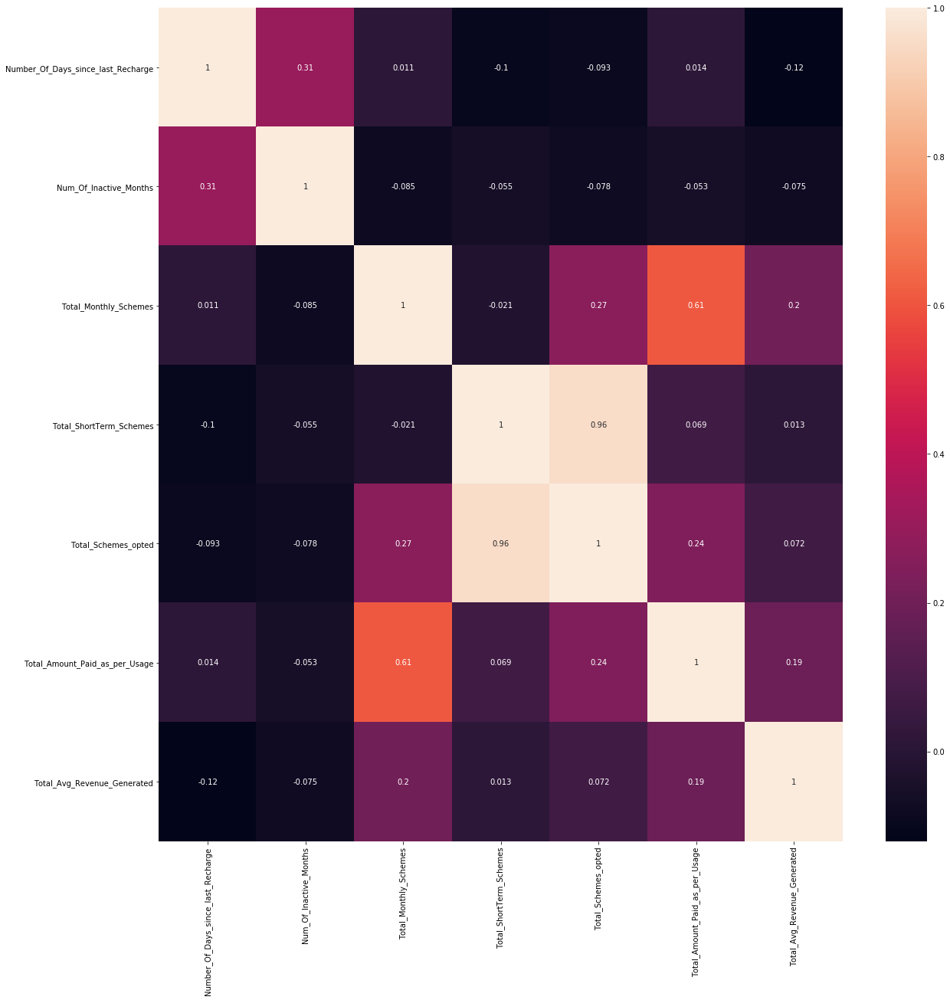

In [47]:
#Checking correlation of derived features with indivitual features
correlate=telecom[['Number_Of_Days_since_last_Recharge','Num_Of_Inactive_Months','Total_Monthly_Schemes','Total_ShortTerm_Schemes','Total_Schemes_opted','Total_Amount_Paid_as_per_Usage','Total_Avg_Revenue_Generated']]
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Let's see the correlation matrix 
plt.figure(figsize = (20,20))     # Size of the figure
sns.heatmap(correlate.corr(),annot = True)

In [48]:
#Dropping highly correlated attributes with the derived features
telecom=telecom.drop(['Total_ShortTerm_Schemes','Total_Monthly_Schemes'],axis=1)

In [143]:
#Checking the churn rate
churn = (sum(telecom['Churn'])/len(telecom['Churn'].index))*100
churn

8.636045231662164

We have a churn rate of around 8%

# Splitting Data into Training and Testing Sets

In [49]:
# Putting response variable to y
Y = telecom['Churn']
response=telecom.drop(['Churn'],axis=1)
# Putting feature variable to X
X=response

In [50]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Let's see the correlation matrix 
plt.figure(figsize = (200,200))     # Size of the figure
sns.heatmap(X.corr(),annot = True)

In [51]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.7 ,test_size = 0.3, random_state=100)

In [52]:
#Checking the shape
X_train.shape

(20985, 133)

In [53]:
#Checking the datatypes of the columns
X.dtypes

mobile_number                           int64
arpu_6                                float64
arpu_7                                float64
arpu_8                                float64
onnet_mou_6                           float64
onnet_mou_7                           float64
onnet_mou_8                           float64
offnet_mou_6                          float64
offnet_mou_7                          float64
offnet_mou_8                          float64
roam_ic_mou_6                         float64
roam_ic_mou_7                         float64
roam_ic_mou_8                         float64
roam_ic_mou_9                         float64
roam_og_mou_6                         float64
roam_og_mou_7                         float64
roam_og_mou_8                         float64
loc_og_t2t_mou_6                      float64
loc_og_t2t_mou_7                      float64
loc_og_t2t_mou_8                      float64
loc_og_t2m_mou_6                      float64
loc_og_t2m_mou_7                  

In [54]:
#Standardizing all the columns using standard scaler
from sklearn import preprocessing
X_scaler = preprocessing.StandardScaler().fit(X_train)
Y_scaler = preprocessing.StandardScaler().fit(y_train.values.reshape(-1,1))
Xtrain=X_scaler.transform(X_train) 
Ytrain=Y_scaler.transform(y_train.values.reshape(-1,1))
Xtest=X_scaler.transform(X_test)
Ytest=Y_scaler.transform(y_test.values.reshape(-1,1))

C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Anaconda\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [55]:
#Importing the PCA module
from sklearn.decomposition import PCA
pca = PCA( random_state=100)

In [56]:
#Doing the PCA on the train data
pca_initial=pca.fit_transform(Xtrain)

In [57]:
pca_initial.shape

(20985, 133)

# AUTOMATED PCA TO SELECT NUMBER OF COMPONENTS AUTOMATICALLY

In [58]:
#ABOVE SHOWS 133 AS PRINCIPAL COMPONENTS WHICH IS STILL A HIGHER NUMBER,HENCE DOING AUTOMATED 
#APPROACH TO SELECT NUMBER OF COMPONENTS WHICH EXPLAIN 85 % VARIANCE
pca_for_automated=PCA(0.85)

In [59]:
pca_automated=pca_for_automated.fit_transform(Xtrain)
pca_automated_test=pca_for_automated.transform(Xtest)

In [60]:
pca_automated.shape
#ONLY 44 PCA COMPONENT EXPLAINS 85 % VARIANCE

(20985, 44)

# LOGISTIC REGRESSION WITH PCA

In [139]:
#LOGISTIC REGRESSION WITH PCA
from sklearn.linear_model import LogisticRegression
#Using the class weight parameter to handle class imabalance
lr_pca = LogisticRegression(class_weight='balanced')

In [140]:
##Y_train_lr=Ytrain.ravel()
model_lr_pca = lr_pca.fit(pca_automated,y_train)

In [141]:
pca_automated_test = pca_for_automated.transform(Xtest)
pca_automated_test.shape

(8994, 44)

In [142]:
#Making prediction on the test data and check metrics
from sklearn import metrics
pred_probs_test2 = model_lr_pca.predict_proba(pca_automated_test)[:,1]
"{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test2))

'0.90'

# DECISION TREE CLASSIFIER(ALONGWITH GRIDSEARCH FOR HYPERPARAMETER TUNING)

In [65]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  2.7min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(5, 15, 5), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [66]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

C:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessing a training score ('split2_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
C:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:122: FutureWarning: You are accessi

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.819249,0.022418,0.013790,0.007040,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.940686,...,0.940338,0.002459,13,0.945017,0.945020,0.944782,0.942638,0.943594,0.944210,0.000947
1,1.810777,0.051784,0.015313,0.003988,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.940686,...,0.940338,0.002459,13,0.945017,0.945020,0.944782,0.942638,0.943594,0.944210,0.000947
2,1.693694,0.036535,0.011927,0.003950,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.940686,...,0.941053,0.002577,3,0.944362,0.944305,0.942995,0.942757,0.942701,0.943424,0.000750
3,1.666579,0.076615,0.009800,0.006478,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.940686,...,0.941053,0.002577,3,0.944362,0.944305,0.942995,0.942757,0.942701,0.943424,0.000750
4,2.823299,0.112785,0.007271,0.006097,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.935684,...,0.937860,0.002248,15,0.949246,0.948416,0.946926,0.947701,0.947346,0.947927,0.000821
5,2.838638,0.074169,0.008779,0.007400,entropy,10,50,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.935684,...,0.937860,0.002248,15,0.949246,0.948416,0.946926,0.947701,0.947346,0.947927,0.000821
6,2.624120,0.076844,0.012242,0.006408,entropy,10,100,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.939495,...,0.940815,0.002549,11,0.946089,0.946450,0.944127,0.945020,0.944368,0.945211,0.000920
7,2.625855,0.092894,0.009363,0.003267,entropy,10,100,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.939495,...,0.940815,0.002549,11,0.946089,0.946450,0.944127,0.945020,0.944368,0.945211,0.000920
8,1.143019,0.069730,0.011993,0.004692,gini,5,50,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.940210,...,0.941053,0.003375,3,0.944540,0.945437,0.944901,0.942280,0.943951,0.944222,0.001085
9,1.213662,0.034172,0.003446,0.004261,gini,5,50,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.940210,...,0.941053,0.003375,3,0.944540,0.945437,0.944901,0.942280,0.943951,0.944222,0.001085


In [67]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.9411484393614487
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


In [68]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=100,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [69]:
# accuracy score
clf_gini.score(X_test,y_test)

0.9372915276851234

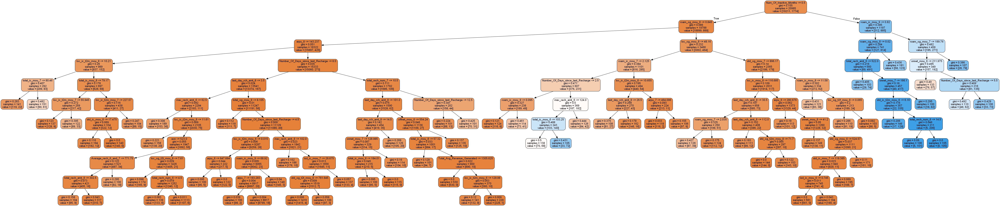

In [71]:
# plotting the tree
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
dot_data = StringIO()
# Putting features
features = list(X.columns[0:])
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [72]:
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.95      0.98      0.97      8179
          1       0.74      0.48      0.58       815

avg / total       0.93      0.94      0.93      8994



In [73]:
# confusion matrix
print(confusion_matrix(y_test,y_pred))
#SEEMS  DESCENT PREDICTIONS AS PER CONFUSION MATRIX BELOW

[[8039  140]
 [ 424  391]]


# RANDOM FOREST CLASSIFIER WITH GRIDSEARCH

In [74]:
#Importing RandomForestClassifier from sklearn
from sklearn.ensemble import RandomForestClassifier
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

C:\Anaconda\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [75]:
#Fit the model
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 144 out of 144 | elapsed: 10.7min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': range(5, 15, 5), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'n_estimators': [100, 200, 300], 'max_features': [5, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [76]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9423397664998808 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 100, 'n_estimators': 200}


Comparing the accuracies of Decision Tree Classifier and random Forest Classifier, we observe that there is no significant improvement using Random Forest Classifier.Hence not proceeding with the latter.

## Building Logistic Regression Model To come up with important features that affect Churn 

In [77]:
import statsmodels.api as sm
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20871
Model Family:                Binomial   Df Model:                          113
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3418.4
Date:                Sat, 17 Nov 2018   Deviance:                       6836.8
Time:                        11:30:26   Pearson chi2:                 3.99e+04
No. Iterations:                    49   Covariance Type:             nonrobust
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                -47.2696    335.990     -0.141      0.888    -705.798     611.259
mobile_number                       6.491e-09    4.8e-08      0.135      0.892   -8.76e-08    1.01e-07
arpu_6                             -6.388e-05      0.000     -0.258      0.796      -0.001       0.000
arpu_7                                 0.0003      0.000      1.151      0.250      -0.000       0.001
arpu_8                                 0.0002      0.000      0.806      0.420      -0.000       0.001
onnet_mou_6                           -0.0007      0.006     -0.112      0.911      -0.012       0.011
onnet_mou_7                            0.0065      0.005      1.325      0.185      -0.003       0.016
onnet_mou_8                           -0.0090      0.007     -1.336      0.181      -0.022       0.004
offnet_mou_6                          -0.0006      0.006     -0.109      0.913      -0.012       0.011
offnet_mou_7                           0.0063      0.005      1.322      0.186      -0.003       0.016
offnet_mou_8                          -0.0093      0.007     -1.382      0.167      -0.022       0.004
roam_ic_mou_6                          0.0009      0.000      1.932      0.053   -1.27e-05       0.002
roam_ic_mou_7                          0.0009      0.001      1.534      0.125      -0.000       0.002
roam_ic_mou_8                         -0.0024      0.001     -3.717      0.000      -0.004      -0.001
roam_ic_mou_9                          0.0024      0.000      4.897      0.000       0.001       0.003
roam_og_mou_6                          0.0008      0.006      0.132      0.895      -0.011       0.012
roam_og_mou_7                         -0.0063      0.005     -1.292      0.196      -0.016       0.003
roam_og_mou_8                          0.0099      0.007      1.457      0.145      -0.003       0.023
loc_og_t2t_mou_6                       0.2833      6.076      0.047      0.963     -11.626      12.193
loc_og_t2t_mou_7                      -5.3874      6.007     -0.897      0.370     -17.162       6.387
loc_og_t2t_mou_8                       8.5211      6.759      1.261      0.207      -4.726      21.768
loc_og_t2m_mou_6                       0.2823      6.076      0.046      0.963     -11.627      12.192
loc_og_t2m_mou_7                      -5.3872      6.007     -0.897      0.370     -17.162       6.387
loc_og_t2m_mou_8                       8.5219      6.759      1.261      0.207      -4.725      21.769
loc_og_t2f_mou_6                       0.2788      6.077      0.046      0.963     -11.632      12.190
loc_og_t2f_mou_7                      -5.3876      6.008     -0.897      0.370     -17.163       6.387
loc_og_t2f_mou_8                       8.5243      6.759      1.261      0.207      -4.723      21.772
loc_og_t2c_mou_6                      -0.0002      0.005     -0.047     

### Feature Selection using RFE

In [78]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 25)             # running RFE with 13 variables as output
rfe = rfe.fit(X,Y)
print(rfe.support_)           # Printing the boolean results
print(rfe.ranking_)           # Printing the ranking

[ True  True  True  True False False  True False  True  True False False
 False False False False False False False False False False False False
 False False False False False False  True  True False False False False
 False False False False False False False  True False False False False
 False False False False False  True  True  True False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False  True  True False
 False False False False False False False False False False False  True
  True  True False False False False False False False False False False
  True  True False False False False False False False False False False
 False False  True False False False False  True False False False  True
  True]
[  1   1   1   1  27  12   1   9   1   1  93  67  69  72  78  55  63  32
  26  24  16  11   7  62  60  58  86  85  82   2   1   1  50  29  13  52
  31   8  81  79  77  42  14   1  95  89  8

In [79]:
#Getting the features selected by RFE
columns=X_train.columns[rfe.support_]
X_train_mod2=X_train[columns]
Y_train_mod2=y_train
X_test_mod2=X_test
Y_test_mod2=y_test

In [80]:
# Let's run the model using the selected variables
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20962
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3956.4
Date:                Sat, 17 Nov 2018   Deviance:                       7912.8
Time:                        11:30:51   Pearson chi2:                 8.79e+09
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                           -145.9831    305.267     -0.478      0.632    -744.296     452.329
mobile_number                   2.065e-08   4.36e-08      0.474      0.636   -6.48e-08    1.06e-07
arpu_6                          9.016e-05      0.000      0.488      0.626      -0.000       0.000
arpu_7                             0.0007      0.000      3.626      0.000       0.000       0.001
arpu_8                            -0.0004      0.000     -1.446      0.148      -0.001       0.000
onnet_mou_8                        0.0024      0.000      7.670      0.000       0.002       0.003
offnet_mou_7                    6.566e-05      0.000      0.544      0.587      -0.000       0.000
offnet_mou_8                       0.0023      0.000      7.186      0.000       0.002       0.003
loc_og_mou_7                      -0.0004      0.000     -1.772      0.076      -0.001    3.83e-05
loc_og_mou_8                       0.0246      0.002     14.708      0.000       0.021       0.028
std_og_mou_8                       0.0255      0.002     15.430      0.000       0.022       0.029
total_og_mou_6                     0.0001   6.81e-05      1.791      0.073   -1.15e-05       0.000
total_og_mou_7                     0.0001      0.000      1.135      0.256   -8.64e-05       0.000
total_og_mou_8                    -0.0285      0.002    -17.879      0.000      -0.032      -0.025
loc_ic_mou_8                      -0.0017      0.001     -2.540      0.011      -0.003      -0.000
total_ic_mou_7                     0.0015      0.000      8.680      0.000       0.001       0.002
total_ic_mou_8                    -0.0037      0.001     -6.535      0.000      -0.005      -0.003
total_rech_amt_6                8.042e-05      0.000      0.512      0.609      -0.000       0.000
total_rech_amt_7                  -0.0003      0.000     -1.689      0.091      -0.001    4.49e-05
total_rech_amt_8                  -0.0018      0.000     -6.682      0.000      -0.002      -0.001
vol_3g_mb_7                     2.229e-05    6.7e-05      0.332      0.740      -0.000       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.306      0.000      -0.001      -0.000
aon                               -0.0003   4.14e-05     -6.201      0.000      -0.000      -0.000
Average_rech_6_and_7           -9.967e-05      0.000     -0.816      0.414      -0.000       0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.88e-05     -2.470      0.014      -0.000      -3e-05
Total_Avg_Revenue_Generated        0.0005      0.000      3.043      0.002       0.000       0.001
==================================================================================================
"""

In [81]:
# Function for computing vif value
def vif_cal(input_data, dependent_col):
    vif_df = pd.DataFrame( columns = ['Feature', 'Vif'])
    x_vars=input_data.drop([dependent_col], axis=1)
    xvar_names=x_vars.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.OLS(y,x).fit().rsquared  
        vif=round(1/(1-rsq),2)
        vif_df.loc[i] = [xvar_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis=0, ascending=False, inplace=False)

In [82]:
cols=list(columns)
cols.append('Churn')
cols
#Getting Dataframe with only selected features
telecom_mod2=telecom[cols]
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')


C:\Anaconda\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


,Feature,Vif
24,Total_Avg_Revenue_Generated,inf
1,arpu_6,inf
2,arpu_7,inf
3,arpu_8,inf
22,Average_rech_6_and_7,inf
17,total_rech_amt_7,inf
16,total_rech_amt_6,inf
12,total_og_mou_8,257.830000
9,std_og_mou_8,206.430000
8,loc_og_mou_8,75.420000


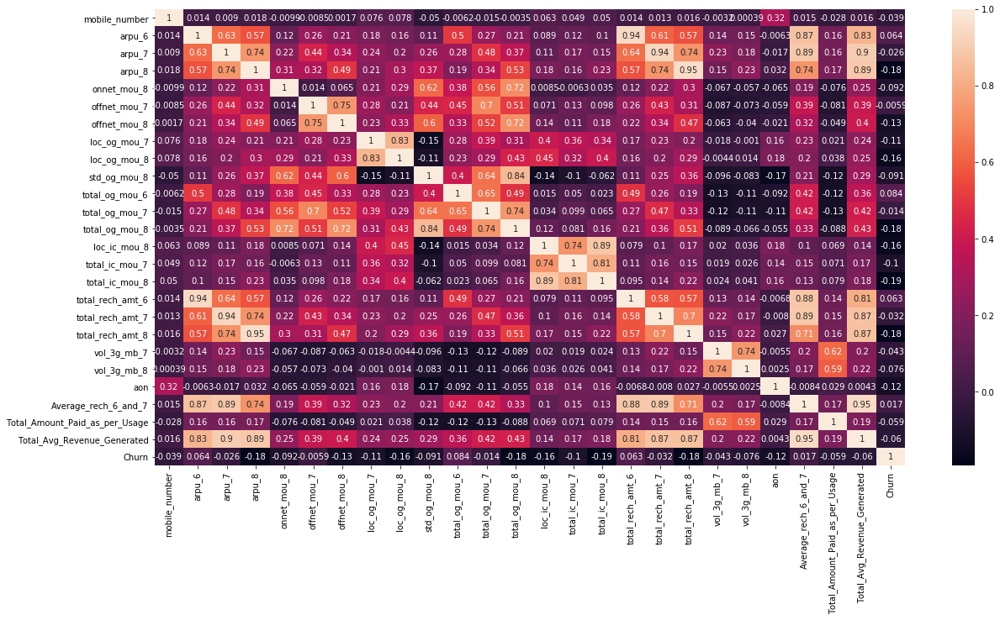

In [83]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [84]:
#Dropping features
X_test_mod2 = X_test_mod2.drop('arpu_6',1)
X_train_mod2 = X_train_mod2.drop('arpu_6',1)
telecom_mod2=telecom_mod2.drop('arpu_6',axis=1)

In [85]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20962
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3956.4
Date:                Sat, 17 Nov 2018   Deviance:                       7912.8
Time:                        11:30:59   Pearson chi2:                 8.79e+09
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                           -145.9831    305.267     -0.478      0.632    -744.296     452.329
mobile_number                   2.065e-08   4.36e-08      0.474      0.636   -6.48e-08    1.06e-07
arpu_7                             0.0006      0.000      2.145      0.032    5.57e-05       0.001
arpu_8                            -0.0005      0.000     -1.198      0.231      -0.001       0.000
onnet_mou_8                        0.0024      0.000      7.670      0.000       0.002       0.003
offnet_mou_7                    6.566e-05      0.000      0.544      0.587      -0.000       0.000
offnet_mou_8                       0.0023      0.000      7.186      0.000       0.002       0.003
loc_og_mou_7                      -0.0004      0.000     -1.772      0.076      -0.001    3.83e-05
loc_og_mou_8                       0.0246      0.002     14.708      0.000       0.021       0.028
std_og_mou_8                       0.0255      0.002     15.430      0.000       0.022       0.029
total_og_mou_6                     0.0001   6.81e-05      1.791      0.073   -1.15e-05       0.000
total_og_mou_7                     0.0001      0.000      1.135      0.256   -8.64e-05       0.000
total_og_mou_8                    -0.0285      0.002    -17.879      0.000      -0.032      -0.025
loc_ic_mou_8                      -0.0017      0.001     -2.540      0.011      -0.003      -0.000
total_ic_mou_7                     0.0015      0.000      8.680      0.000       0.001       0.002
total_ic_mou_8                    -0.0037      0.001     -6.535      0.000      -0.005      -0.003
total_rech_amt_6                8.043e-05      0.000      0.512      0.609      -0.000       0.000
total_rech_amt_7                  -0.0003      0.000     -1.689      0.091      -0.001    4.49e-05
total_rech_amt_8                  -0.0018      0.000     -6.682      0.000      -0.002      -0.001
vol_3g_mb_7                     2.229e-05    6.7e-05      0.332      0.740      -0.000       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.306      0.000      -0.001      -0.000
aon                               -0.0003   4.14e-05     -6.201      0.000      -0.000      -0.000
Average_rech_6_and_7           -9.968e-05      0.000     -0.816      0.414      -0.000       0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.88e-05     -2.470      0.014      -0.000      -3e-05
Total_Avg_Revenue_Generated        0.0005      0.000      2.197      0.028    5.93e-05       0.001
==================================================================================================
"""

In [86]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


,Feature,Vif
15,total_rech_amt_6,inf
21,Average_rech_6_and_7,inf
16,total_rech_amt_7,inf
11,total_og_mou_8,257.830000
8,std_og_mou_8,206.430000
23,Total_Avg_Revenue_Generated,81.850000
7,loc_og_mou_8,75.420000
2,arpu_8,27.710000
5,offnet_mou_8,25.060000
3,onnet_mou_8,21.950000


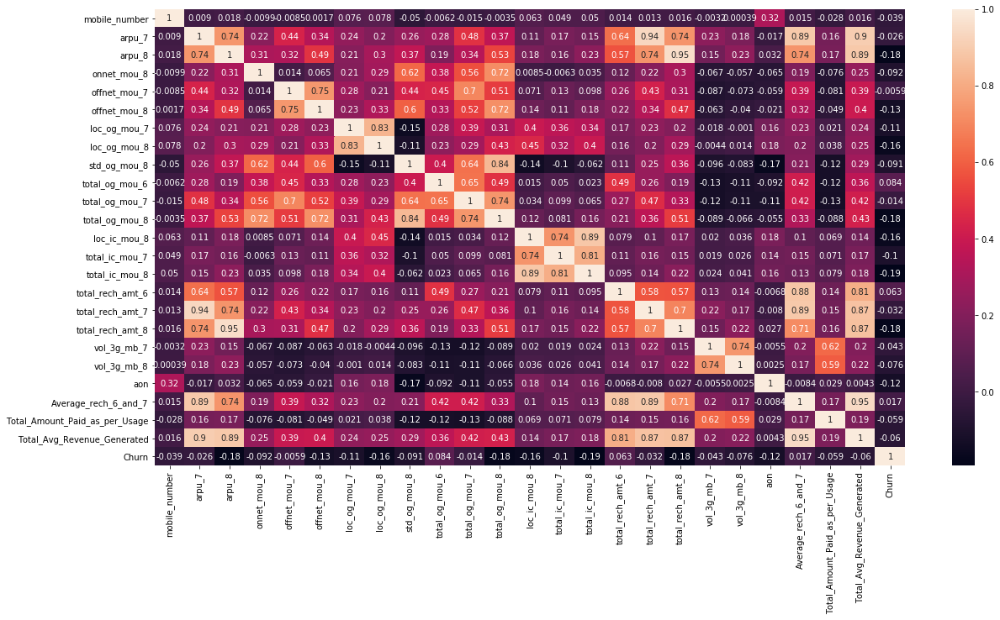

In [87]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [88]:
#Dropping features
X_test_mod2 = X_test_mod2.drop('total_rech_amt_6',1)
X_train_mod2 = X_train_mod2.drop('total_rech_amt_6',1)
telecom_mod2=telecom_mod2.drop('total_rech_amt_6',axis=1)

In [89]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20962
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3956.4
Date:                Sat, 17 Nov 2018   Deviance:                       7912.8
Time:                        11:31:06   Pearson chi2:                 8.79e+09
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                           -145.9831    305.267     -0.478      0.632    -744.296     452.329
mobile_number                   2.065e-08   4.36e-08      0.474      0.636   -6.48e-08    1.06e-07
arpu_7                             0.0006      0.000      2.145      0.032    5.57e-05       0.001
arpu_8                            -0.0005      0.000     -1.198      0.231      -0.001       0.000
onnet_mou_8                        0.0024      0.000      7.670      0.000       0.002       0.003
offnet_mou_7                    6.566e-05      0.000      0.544      0.587      -0.000       0.000
offnet_mou_8                       0.0023      0.000      7.186      0.000       0.002       0.003
loc_og_mou_7                      -0.0004      0.000     -1.772      0.076      -0.001    3.83e-05
loc_og_mou_8                       0.0246      0.002     14.708      0.000       0.021       0.028
std_og_mou_8                       0.0255      0.002     15.430      0.000       0.022       0.029
total_og_mou_6                     0.0001   6.81e-05      1.791      0.073   -1.15e-05       0.000
total_og_mou_7                     0.0001      0.000      1.135      0.256   -8.64e-05       0.000
total_og_mou_8                    -0.0285      0.002    -17.879      0.000      -0.032      -0.025
loc_ic_mou_8                      -0.0017      0.001     -2.540      0.011      -0.003      -0.000
total_ic_mou_7                     0.0015      0.000      8.680      0.000       0.001       0.002
total_ic_mou_8                    -0.0037      0.001     -6.535      0.000      -0.005      -0.003
total_rech_amt_7                  -0.0004      0.000     -1.706      0.088      -0.001    5.36e-05
total_rech_amt_8                  -0.0018      0.000     -6.682      0.000      -0.002      -0.001
vol_3g_mb_7                     2.229e-05    6.7e-05      0.332      0.740      -0.000       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.306      0.000      -0.001      -0.000
aon                               -0.0003   4.14e-05     -6.201      0.000      -0.000      -0.000
Average_rech_6_and_7            6.117e-05      0.000      0.148      0.882      -0.001       0.001
Total_Amount_Paid_as_per_Usage    -0.0001   5.88e-05     -2.470      0.014      -0.000      -3e-05
Total_Avg_Revenue_Generated        0.0005      0.000      2.197      0.028    5.93e-05       0.001
==================================================================================================
"""

In [90]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
11,total_og_mou_8,257.83
8,std_og_mou_8,206.43
22,Total_Avg_Revenue_Generated,81.85
7,loc_og_mou_8,75.42
20,Average_rech_6_and_7,33.79
2,arpu_8,27.71
5,offnet_mou_8,25.06
3,onnet_mou_8,21.95
1,arpu_7,19.24
15,total_rech_amt_7,14.99


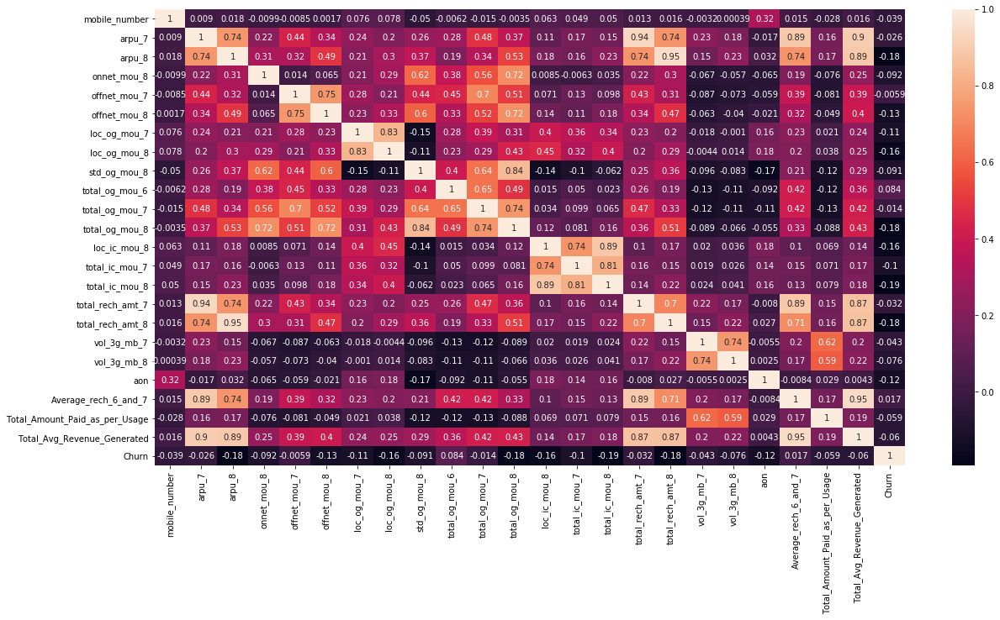

In [91]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [92]:
#Dropping features
X_test_mod2 = X_test_mod2.drop('total_og_mou_8',1)
X_train_mod2 = X_train_mod2.drop('total_og_mou_8',1)
telecom_mod2=telecom_mod2.drop('total_og_mou_8',axis=1)

In [93]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20963
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4124.1
Date:                Sat, 17 Nov 2018   Deviance:                       8248.1
Time:                        11:31:13   Pearson chi2:                 1.71e+09
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -81.7776    295.134     -0.277      0.782    -660.229     496.674
mobile_number                   1.151e-08   4.22e-08      0.273      0.785   -7.11e-08    9.41e-08
arpu_7                             0.0005      0.000      1.812      0.070   -4.39e-05       0.001
arpu_8                            -0.0017      0.000     -4.235      0.000      -0.002      -0.001
onnet_mou_8                        0.0034      0.000     10.911      0.000       0.003       0.004
offnet_mou_7                    5.994e-05      0.000      0.506      0.613      -0.000       0.000
offnet_mou_8                       0.0034      0.000     10.600      0.000       0.003       0.004
loc_og_mou_7                      -0.0007      0.000     -3.436      0.001      -0.001      -0.000
loc_og_mou_8                      -0.0042      0.000    -10.480      0.000      -0.005      -0.003
std_og_mou_8                      -0.0036      0.000    -13.396      0.000      -0.004      -0.003
total_og_mou_6                  5.046e-05   6.54e-05      0.772      0.440   -7.77e-05       0.000
total_og_mou_7                 -1.613e-05      0.000     -0.157      0.875      -0.000       0.000
loc_ic_mou_8                       0.0061      0.001      7.797      0.000       0.005       0.008
total_ic_mou_7                     0.0018      0.000     10.377      0.000       0.001       0.002
total_ic_mou_8                    -0.0111      0.001    -14.903      0.000      -0.013      -0.010
total_rech_amt_7                  -0.0004      0.000     -1.990      0.047      -0.001   -6.23e-06
total_rech_amt_8                  -0.0021      0.000     -7.423      0.000      -0.003      -0.002
vol_3g_mb_7                     2.043e-05   6.31e-05      0.324      0.746      -0.000       0.000
vol_3g_mb_8                       -0.0004      0.000     -4.154      0.000      -0.001      -0.000
aon                               -0.0003   4.04e-05     -6.264      0.000      -0.000      -0.000
Average_rech_6_and_7               0.0002      0.000      0.395      0.693      -0.001       0.001
Total_Amount_Paid_as_per_Usage    -0.0001   5.62e-05     -2.393      0.017      -0.000   -2.43e-05
Total_Avg_Revenue_Generated        0.0007      0.000      2.959      0.003       0.000       0.001
==================================================================================================
"""

In [94]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
21,Total_Avg_Revenue_Generated,81.71
8,std_og_mou_8,35.41
19,Average_rech_6_and_7,33.77
2,arpu_8,27.69
5,offnet_mou_8,24.27
3,onnet_mou_8,21.37
1,arpu_7,19.23
7,loc_og_mou_8,15.11
14,total_rech_amt_7,14.99
15,total_rech_amt_8,13.06


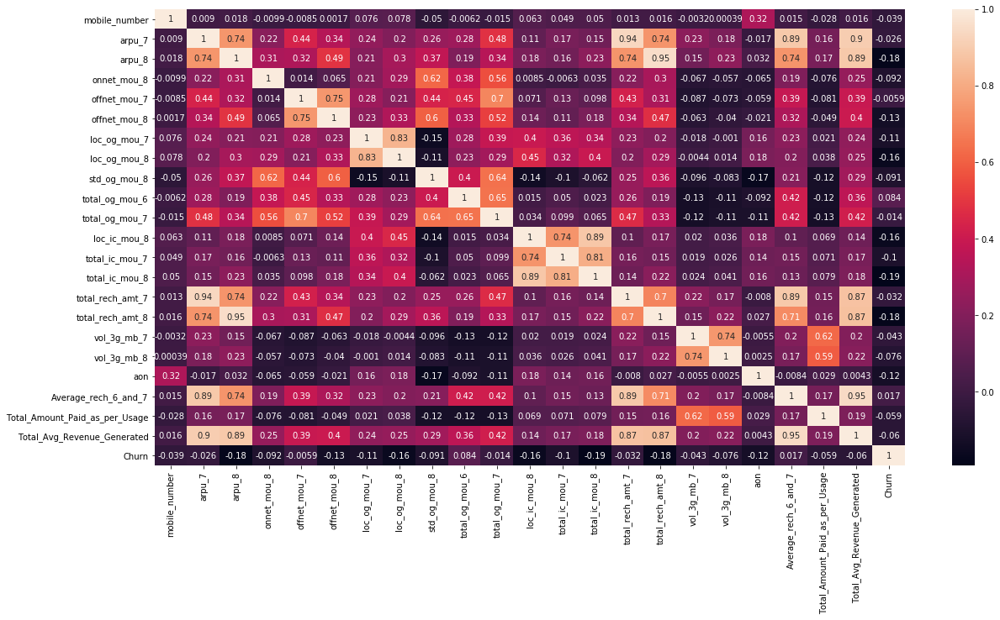

In [95]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [96]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('Average_rech_6_and_7',1)
X_train_mod2 = X_train_mod2.drop('Average_rech_6_and_7',1)
telecom_mod2=telecom_mod2.drop('Average_rech_6_and_7',axis=1)

In [97]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20964
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4124.1
Date:                Sat, 17 Nov 2018   Deviance:                       8248.3
Time:                        11:31:19   Pearson chi2:                 1.71e+09
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -81.5333    295.138     -0.276      0.782    -659.993     496.926
mobile_number                   1.147e-08   4.22e-08      0.272      0.786   -7.12e-08    9.41e-08
arpu_7                             0.0005      0.000      1.775      0.076   -5.23e-05       0.001
arpu_8                            -0.0017      0.000     -4.641      0.000      -0.002      -0.001
onnet_mou_8                        0.0035      0.000     10.989      0.000       0.003       0.004
offnet_mou_7                    6.042e-05      0.000      0.510      0.610      -0.000       0.000
offnet_mou_8                       0.0034      0.000     10.668      0.000       0.003       0.004
loc_og_mou_7                      -0.0007      0.000     -3.434      0.001      -0.001      -0.000
loc_og_mou_8                      -0.0042      0.000    -10.533      0.000      -0.005      -0.003
std_og_mou_8                      -0.0036      0.000    -13.520      0.000      -0.004      -0.003
total_og_mou_6                  5.211e-05   6.52e-05      0.799      0.424   -7.58e-05       0.000
total_og_mou_7                 -1.656e-05      0.000     -0.161      0.872      -0.000       0.000
loc_ic_mou_8                       0.0062      0.001      7.800      0.000       0.005       0.008
total_ic_mou_7                     0.0018      0.000     10.373      0.000       0.001       0.002
total_ic_mou_8                    -0.0111      0.001    -14.905      0.000      -0.013      -0.010
total_rech_amt_7                  -0.0004      0.000     -2.032      0.042      -0.001   -1.35e-05
total_rech_amt_8                  -0.0021      0.000     -7.767      0.000      -0.003      -0.002
vol_3g_mb_7                     2.058e-05   6.31e-05      0.326      0.745      -0.000       0.000
vol_3g_mb_8                       -0.0004      0.000     -4.154      0.000      -0.001      -0.000
aon                               -0.0003   4.04e-05     -6.261      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.61e-05     -2.408      0.016      -0.000   -2.52e-05
Total_Avg_Revenue_Generated        0.0008      0.000      7.390      0.000       0.001       0.001
==================================================================================================
"""

In [98]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
8,std_og_mou_8,35.35
5,offnet_mou_8,24.24
20,Total_Avg_Revenue_Generated,22.48
3,onnet_mou_8,21.34
2,arpu_8,19.67
1,arpu_7,16.25
7,loc_og_mou_8,15.10
15,total_rech_amt_8,13.05
14,total_rech_amt_7,9.73
10,total_og_mou_7,7.69


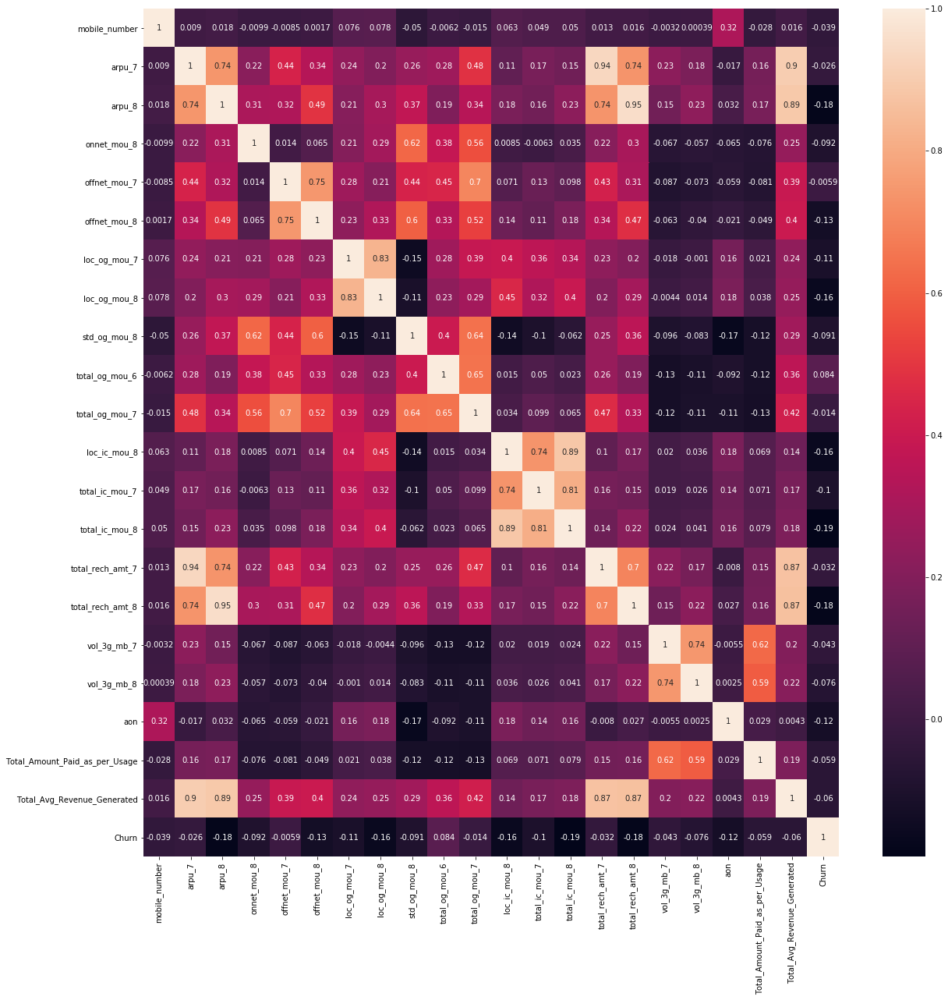

In [99]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [100]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('std_og_mou_8',1)
X_train_mod2 = X_train_mod2.drop('std_og_mou_8',1)
telecom_mod2=telecom_mod2.drop('std_og_mou_8',axis=1)

In [101]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20965
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4215.7
Date:                Sat, 17 Nov 2018   Deviance:                       8431.4
Time:                        11:31:25   Pearson chi2:                 9.41e+10
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -88.5268    291.495     -0.304      0.761    -659.847     482.793
mobile_number                   1.246e-08   4.16e-08      0.299      0.765   -6.91e-08    9.41e-08
arpu_7                             0.0004      0.000      1.328      0.184      -0.000       0.001
arpu_8                            -0.0013      0.000     -3.598      0.000      -0.002      -0.001
onnet_mou_8                    -9.947e-05      0.000     -0.623      0.533      -0.000       0.000
offnet_mou_7                       0.0002      0.000      1.875      0.061   -9.96e-06       0.000
offnet_mou_8                      -0.0002      0.000     -1.029      0.304      -0.001       0.000
loc_og_mou_7                      -0.0005      0.000     -2.497      0.013      -0.001      -0.000
loc_og_mou_8                      -0.0014      0.000     -3.700      0.000      -0.002      -0.001
total_og_mou_6                   5.61e-05   6.51e-05      0.862      0.389   -7.15e-05       0.000
total_og_mou_7                    -0.0002      0.000     -2.347      0.019      -0.000   -3.96e-05
loc_ic_mou_8                       0.0076      0.001      9.380      0.000       0.006       0.009
total_ic_mou_7                     0.0020      0.000     11.445      0.000       0.002       0.002
total_ic_mou_8                    -0.0134      0.001    -17.871      0.000      -0.015      -0.012
total_rech_amt_7                  -0.0002      0.000     -1.011      0.312      -0.001       0.000
total_rech_amt_8                  -0.0017      0.000     -6.492      0.000      -0.002      -0.001
vol_3g_mb_7                    -2.108e-05    6.3e-05     -0.335      0.738      -0.000       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.391      0.000      -0.001      -0.000
aon                               -0.0002   4.01e-05     -5.845      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.72e-05     -2.046      0.041      -0.000    -4.9e-06
Total_Avg_Revenue_Generated        0.0009      0.000      7.852      0.000       0.001       0.001
==================================================================================================
"""

In [102]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
19,Total_Avg_Revenue_Generated,22.42
2,arpu_8,19.67
1,arpu_7,16.24
14,total_rech_amt_8,13.02
13,total_rech_amt_7,9.72
9,total_og_mou_7,7.43
12,total_ic_mou_8,6.78
10,loc_ic_mou_8,5.17
4,offnet_mou_7,5.12
7,loc_og_mou_8,4.78


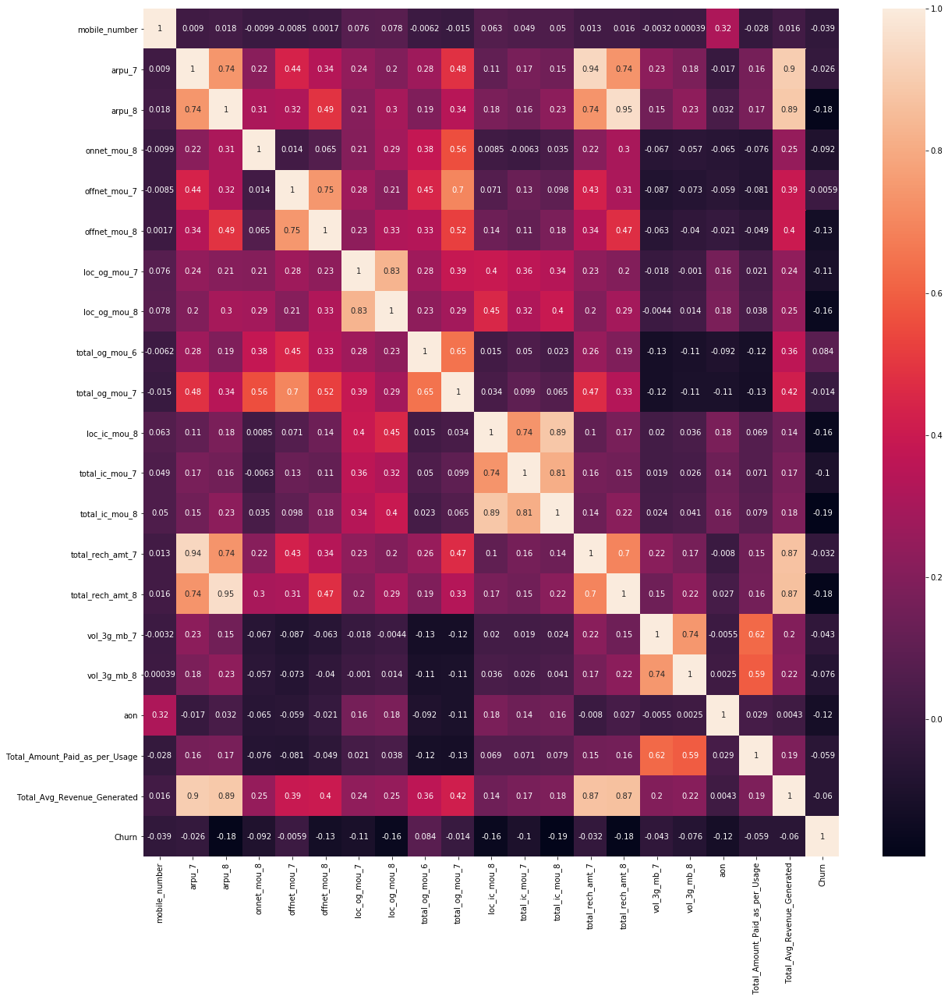

In [103]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [104]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('arpu_7',1)
X_train_mod2 = X_train_mod2.drop('arpu_7',1)
telecom_mod2=telecom_mod2.drop('arpu_7',axis=1)

In [105]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20966
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4216.6
Date:                Sat, 17 Nov 2018   Deviance:                       8433.2
Time:                        11:31:30   Pearson chi2:                 9.08e+10
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -92.8540    291.461     -0.319      0.750    -664.107     478.399
mobile_number                   1.308e-08   4.16e-08      0.314      0.753   -6.85e-08    9.47e-08
arpu_8                            -0.0014      0.000     -4.127      0.000      -0.002      -0.001
onnet_mou_8                       -0.0001      0.000     -0.721      0.471      -0.000       0.000
offnet_mou_7                       0.0002      0.000      1.930      0.054   -3.51e-06       0.000
offnet_mou_8                      -0.0002      0.000     -1.167      0.243      -0.001       0.000
loc_og_mou_7                      -0.0005      0.000     -2.476      0.013      -0.001      -0.000
loc_og_mou_8                      -0.0014      0.000     -3.709      0.000      -0.002      -0.001
total_og_mou_6                  2.489e-05   6.11e-05      0.408      0.683   -9.48e-05       0.000
total_og_mou_7                    -0.0002   9.83e-05     -2.054      0.040      -0.000   -9.27e-06
loc_ic_mou_8                       0.0075      0.001      9.348      0.000       0.006       0.009
total_ic_mou_7                     0.0020      0.000     11.531      0.000       0.002       0.002
total_ic_mou_8                    -0.0134      0.001    -17.859      0.000      -0.015      -0.012
total_rech_amt_7               -2.259e-05      0.000     -0.167      0.868      -0.000       0.000
total_rech_amt_8                  -0.0016      0.000     -6.319      0.000      -0.002      -0.001
vol_3g_mb_7                    -1.193e-05   6.28e-05     -0.190      0.849      -0.000       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.444      0.000      -0.001      -0.000
aon                               -0.0002   4.01e-05     -5.873      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.73e-05     -2.079      0.038      -0.000   -6.84e-06
Total_Avg_Revenue_Generated        0.0010   9.68e-05     10.050      0.000       0.001       0.001
==================================================================================================
"""

In [106]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
1,arpu_8,16.40
18,Total_Avg_Revenue_Generated,15.27
13,total_rech_amt_8,12.05
8,total_og_mou_7,7.02
11,total_ic_mou_8,6.78
12,total_rech_amt_7,5.95
9,loc_ic_mou_8,5.17
3,offnet_mou_7,5.11
6,loc_og_mou_8,4.77
5,loc_og_mou_7,4.49


In [107]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('arpu_8',1)
X_train_mod2 = X_train_mod2.drop('arpu_8',1)
telecom_mod2=telecom_mod2.drop('arpu_8',axis=1)

In [108]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20967
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4226.0
Date:                Sat, 17 Nov 2018   Deviance:                       8452.0
Time:                        11:31:32   Pearson chi2:                 2.26e+11
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -93.9680    290.798     -0.323      0.747    -663.922     475.986
mobile_number                   1.324e-08   4.15e-08      0.319      0.750   -6.82e-08    9.47e-08
onnet_mou_8                       -0.0003      0.000     -2.027      0.043      -0.001      -1e-05
offnet_mou_7                       0.0002      0.000      2.146      0.032    2.16e-05       0.000
offnet_mou_8                      -0.0004      0.000     -2.768      0.006      -0.001      -0.000
loc_og_mou_7                      -0.0004      0.000     -2.234      0.025      -0.001   -5.44e-05
loc_og_mou_8                      -0.0016      0.000     -4.369      0.000      -0.002      -0.001
total_og_mou_6                  8.216e-05   5.89e-05      1.396      0.163   -3.32e-05       0.000
total_og_mou_7                    -0.0001   9.67e-05     -1.374      0.169      -0.000    5.66e-05
loc_ic_mou_8                       0.0082      0.001     10.376      0.000       0.007       0.010
total_ic_mou_7                     0.0020      0.000     11.570      0.000       0.002       0.002
total_ic_mou_8                    -0.0140      0.001    -18.920      0.000      -0.015      -0.013
total_rech_amt_7                  -0.0001      0.000     -0.818      0.414      -0.000       0.000
total_rech_amt_8                  -0.0023      0.000    -12.256      0.000      -0.003      -0.002
vol_3g_mb_7                     3.222e-05   6.14e-05      0.524      0.600   -8.82e-05       0.000
vol_3g_mb_8                       -0.0006      0.000     -6.007      0.000      -0.001      -0.000
aon                               -0.0002   3.99e-05     -6.127      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.68e-05     -2.155      0.031      -0.000   -1.11e-05
Total_Avg_Revenue_Generated        0.0008   8.71e-05      9.554      0.000       0.001       0.001
==================================================================================================
"""

In [109]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
17,Total_Avg_Revenue_Generated,13.12
7,total_og_mou_7,6.96
12,total_rech_amt_8,6.91
10,total_ic_mou_8,6.76
11,total_rech_amt_7,5.94
8,loc_ic_mou_8,5.17
2,offnet_mou_7,5.10
5,loc_og_mou_8,4.77
4,loc_og_mou_7,4.49
3,offnet_mou_8,3.37


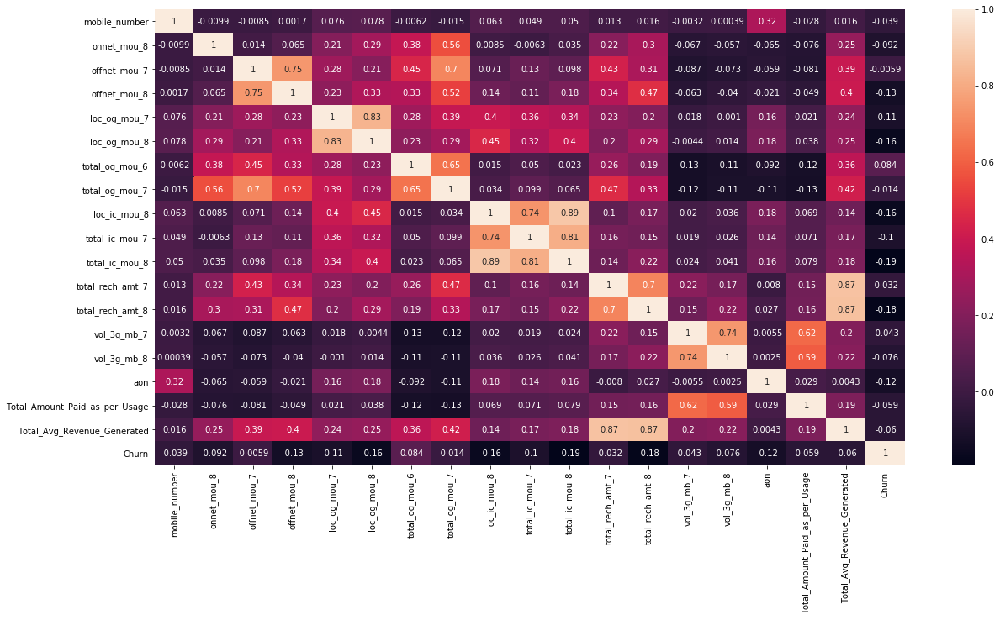

In [110]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [111]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('total_rech_amt_7',1)
X_train_mod2 = X_train_mod2.drop('total_rech_amt_7',1)
telecom_mod2=telecom_mod2.drop('total_rech_amt_7',axis=1)

In [112]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20968
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4226.3
Date:                Sat, 17 Nov 2018   Deviance:                       8452.6
Time:                        11:31:37   Pearson chi2:                 2.35e+11
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -92.6392    290.777     -0.319      0.750    -662.552     477.274
mobile_number                   1.305e-08   4.15e-08      0.314      0.753   -6.84e-08    9.45e-08
onnet_mou_8                       -0.0003      0.000     -1.972      0.049      -0.001   -1.85e-06
offnet_mou_7                       0.0002      0.000      2.111      0.035    1.75e-05       0.000
offnet_mou_8                      -0.0004      0.000     -2.695      0.007      -0.001      -0.000
loc_og_mou_7                      -0.0004      0.000     -2.261      0.024      -0.001   -5.97e-05
loc_og_mou_8                      -0.0016      0.000     -4.370      0.000      -0.002      -0.001
total_og_mou_6                     0.0001   5.23e-05      1.990      0.047    1.57e-06       0.000
total_og_mou_7                    -0.0002   9.03e-05     -1.785      0.074      -0.000    1.58e-05
loc_ic_mou_8                       0.0083      0.001     10.430      0.000       0.007       0.010
total_ic_mou_7                     0.0020      0.000     11.542      0.000       0.002       0.002
total_ic_mou_8                    -0.0140      0.001    -18.956      0.000      -0.015      -0.013
total_rech_amt_8                  -0.0022      0.000    -12.277      0.000      -0.003      -0.002
vol_3g_mb_7                     2.336e-05   6.04e-05      0.387      0.699   -9.49e-05       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.981      0.000      -0.001      -0.000
aon                               -0.0002   3.99e-05     -6.158      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.66e-05     -2.110      0.035      -0.000   -8.51e-06
Total_Avg_Revenue_Generated        0.0008   6.28e-05     12.463      0.000       0.001       0.001
==================================================================================================
"""

In [113]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
10,total_ic_mou_8,6.76
11,total_rech_amt_8,6.51
7,total_og_mou_7,6.48
16,Total_Avg_Revenue_Generated,6.12
8,loc_ic_mou_8,5.17
2,offnet_mou_7,5.08
5,loc_og_mou_8,4.77
4,loc_og_mou_7,4.49
3,offnet_mou_8,3.34
1,onnet_mou_8,3.25


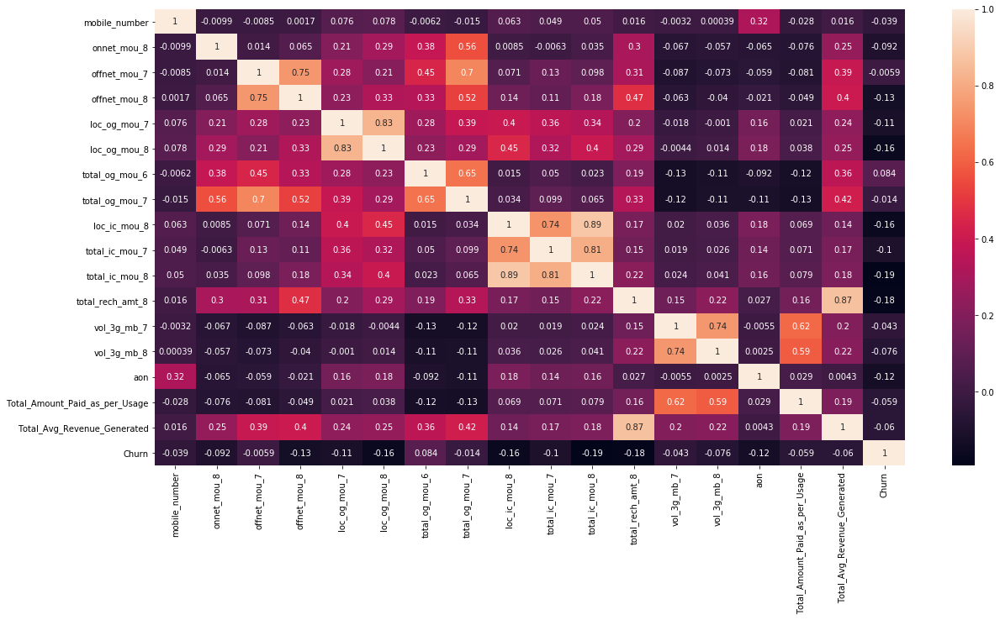

In [114]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [115]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('loc_ic_mou_8',1)
X_train_mod2 = X_train_mod2.drop('loc_ic_mou_8',1)
telecom_mod2=telecom_mod2.drop('loc_ic_mou_8',axis=1)

In [116]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20969
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4285.1
Date:                Sat, 17 Nov 2018   Deviance:                       8570.2
Time:                        11:31:41   Pearson chi2:                 1.40e+07
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -78.0357    287.743     -0.271      0.786    -642.002     485.931
mobile_number                   1.099e-08   4.11e-08      0.267      0.789   -6.96e-08    9.15e-08
onnet_mou_8                       -0.0003      0.000     -1.914      0.056      -0.001    7.02e-06
offnet_mou_7                       0.0002      0.000      1.992      0.046    3.68e-06       0.000
offnet_mou_8                      -0.0004      0.000     -2.607      0.009      -0.001      -0.000
loc_og_mou_7                      -0.0004      0.000     -1.911      0.056      -0.001    9.48e-06
loc_og_mou_8                      -0.0008      0.000     -2.359      0.018      -0.001      -0.000
total_og_mou_6                     0.0001   5.17e-05      2.241      0.025    1.46e-05       0.000
total_og_mou_7                    -0.0002   8.97e-05     -2.764      0.006      -0.000   -7.21e-05
total_ic_mou_7                     0.0020      0.000     11.712      0.000       0.002       0.002
total_ic_mou_8                    -0.0080      0.000    -19.706      0.000      -0.009      -0.007
total_rech_amt_8                  -0.0026      0.000    -14.612      0.000      -0.003      -0.002
vol_3g_mb_7                     2.482e-05   5.96e-05      0.416      0.677    -9.2e-05       0.000
vol_3g_mb_8                       -0.0006      0.000     -5.733      0.000      -0.001      -0.000
aon                               -0.0002   3.96e-05     -6.113      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage    -0.0001   5.63e-05     -1.926      0.054      -0.000    1.93e-06
Total_Avg_Revenue_Generated        0.0008   6.39e-05     13.042      0.000       0.001       0.001
==================================================================================================
"""

In [117]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
10,total_rech_amt_8,6.51
7,total_og_mou_7,6.47
15,Total_Avg_Revenue_Generated,6.12
2,offnet_mou_7,5.08
5,loc_og_mou_8,4.70
4,loc_og_mou_7,4.48
9,total_ic_mou_8,3.36
3,offnet_mou_8,3.34
1,onnet_mou_8,3.24
8,total_ic_mou_7,3.24


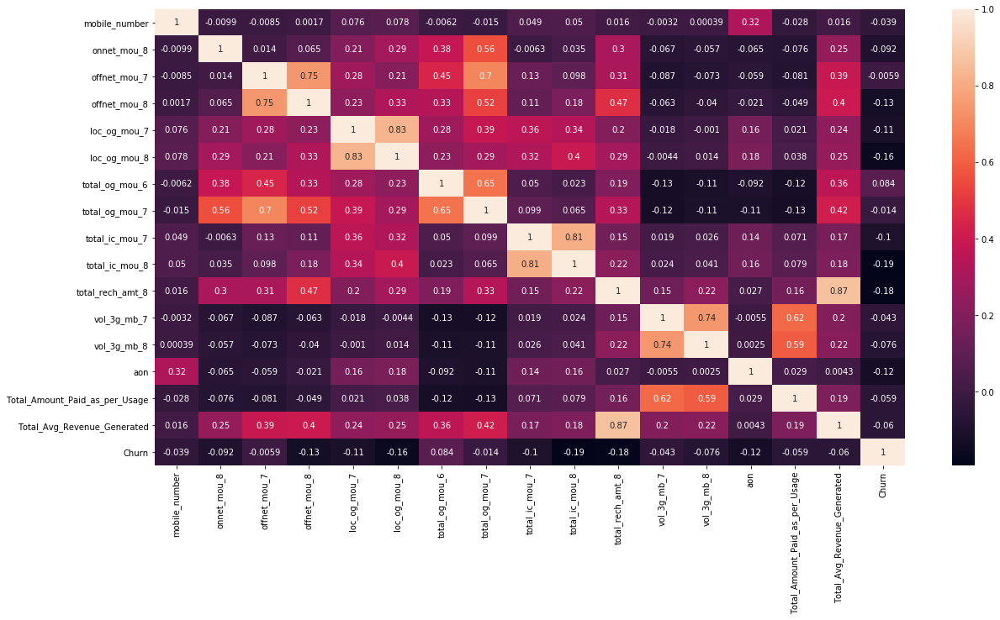

In [118]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [119]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('total_rech_amt_8',1)
X_train_mod2 = X_train_mod2.drop('total_rech_amt_8',1)
telecom_mod2=telecom_mod2.drop('total_rech_amt_8',axis=1)

In [120]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20970
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4402.5
Date:                Sat, 17 Nov 2018   Deviance:                       8805.0
Time:                        11:31:45   Pearson chi2:                 5.95e+07
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -44.4880    283.420     -0.157      0.875    -599.981     511.005
mobile_number                   6.228e-09   4.05e-08      0.154      0.878   -7.31e-08    8.56e-08
onnet_mou_8                       -0.0013      0.000     -9.248      0.000      -0.002      -0.001
offnet_mou_7                       0.0003      0.000      2.885      0.004       0.000       0.001
offnet_mou_8                      -0.0015      0.000    -10.699      0.000      -0.002      -0.001
loc_og_mou_7                      -0.0002      0.000     -1.015      0.310      -0.001       0.000
loc_og_mou_8                      -0.0008      0.000     -2.398      0.016      -0.001      -0.000
total_og_mou_6                     0.0004   4.71e-05      8.920      0.000       0.000       0.001
total_og_mou_7                 -4.268e-05   8.94e-05     -0.477      0.633      -0.000       0.000
total_ic_mou_7                     0.0022      0.000     12.595      0.000       0.002       0.003
total_ic_mou_8                    -0.0091      0.000    -21.791      0.000      -0.010      -0.008
vol_3g_mb_7                        0.0002   5.66e-05      3.439      0.001    8.38e-05       0.000
vol_3g_mb_8                       -0.0010      0.000     -8.943      0.000      -0.001      -0.001
aon                               -0.0002    3.9e-05     -6.127      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage  -8.69e-05   5.58e-05     -1.557      0.119      -0.000    2.25e-05
Total_Avg_Revenue_Generated     6.851e-05   2.06e-05      3.324      0.001    2.81e-05       0.000
==================================================================================================
"""

In [121]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
7,total_og_mou_7,6.39
2,offnet_mou_7,5.04
5,loc_og_mou_8,4.70
4,loc_og_mou_7,4.48
9,total_ic_mou_8,3.35
8,total_ic_mou_7,3.23
1,onnet_mou_8,2.97
3,offnet_mou_8,2.80
10,vol_3g_mb_7,2.56
11,vol_3g_mb_8,2.41


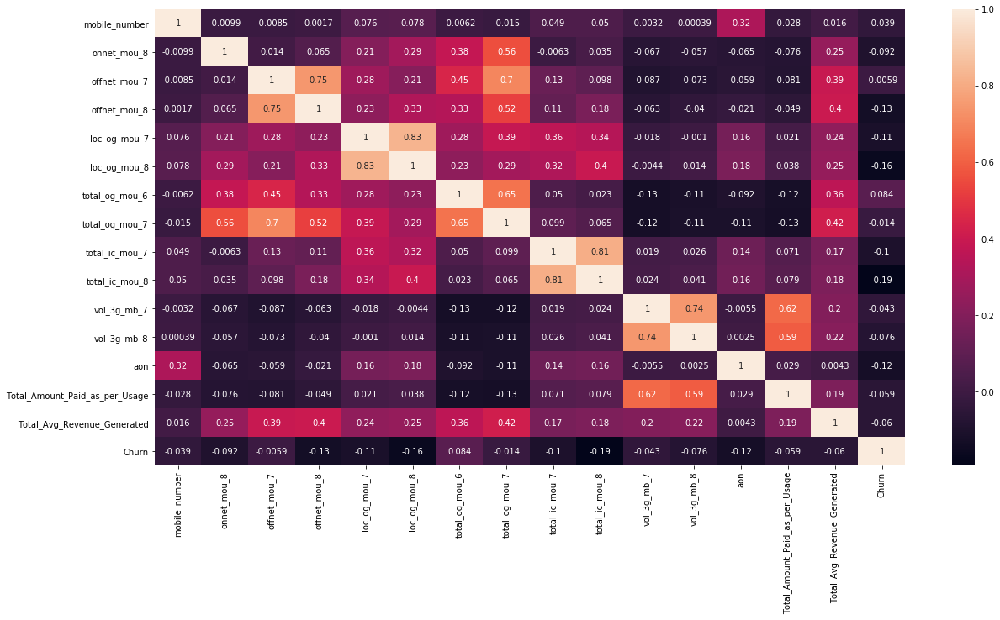

In [122]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [123]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('total_og_mou_7',1)
X_train_mod2 = X_train_mod2.drop('total_og_mou_7',1)
telecom_mod2=telecom_mod2.drop('total_og_mou_7',axis=1)

In [124]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20971
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4402.6
Date:                Sat, 17 Nov 2018   Deviance:                       8805.2
Time:                        11:31:48   Pearson chi2:                 5.69e+07
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -44.1205    283.429     -0.156      0.876    -599.632     511.391
mobile_number                   6.176e-09   4.05e-08      0.153      0.879   -7.32e-08    8.55e-08
onnet_mou_8                       -0.0013      0.000    -11.546      0.000      -0.002      -0.001
offnet_mou_7                       0.0003    8.5e-05      3.516      0.000       0.000       0.000
offnet_mou_8                      -0.0015      0.000    -10.697      0.000      -0.002      -0.001
loc_og_mou_7                      -0.0002      0.000     -1.109      0.268      -0.001       0.000
loc_og_mou_8                      -0.0008      0.000     -2.360      0.018      -0.001      -0.000
total_og_mou_6                     0.0004   4.47e-05      9.239      0.000       0.000       0.001
total_ic_mou_7                     0.0022      0.000     12.603      0.000       0.002       0.003
total_ic_mou_8                    -0.0091      0.000    -21.794      0.000      -0.010      -0.008
vol_3g_mb_7                        0.0002   5.67e-05      3.441      0.001    8.39e-05       0.000
vol_3g_mb_8                       -0.0010      0.000     -8.938      0.000      -0.001      -0.001
aon                               -0.0002    3.9e-05     -6.111      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage -8.624e-05   5.58e-05     -1.546      0.122      -0.000    2.31e-05
Total_Avg_Revenue_Generated     6.821e-05   2.07e-05      3.301      0.001    2.77e-05       0.000
==================================================================================================
"""

In [125]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
5,loc_og_mou_8,4.30
4,loc_og_mou_7,3.96
8,total_ic_mou_8,3.34
7,total_ic_mou_7,3.22
2,offnet_mou_7,2.93
3,offnet_mou_8,2.79
9,vol_3g_mb_7,2.56
10,vol_3g_mb_8,2.41
12,Total_Amount_Paid_as_per_Usage,1.78
6,total_og_mou_6,1.62


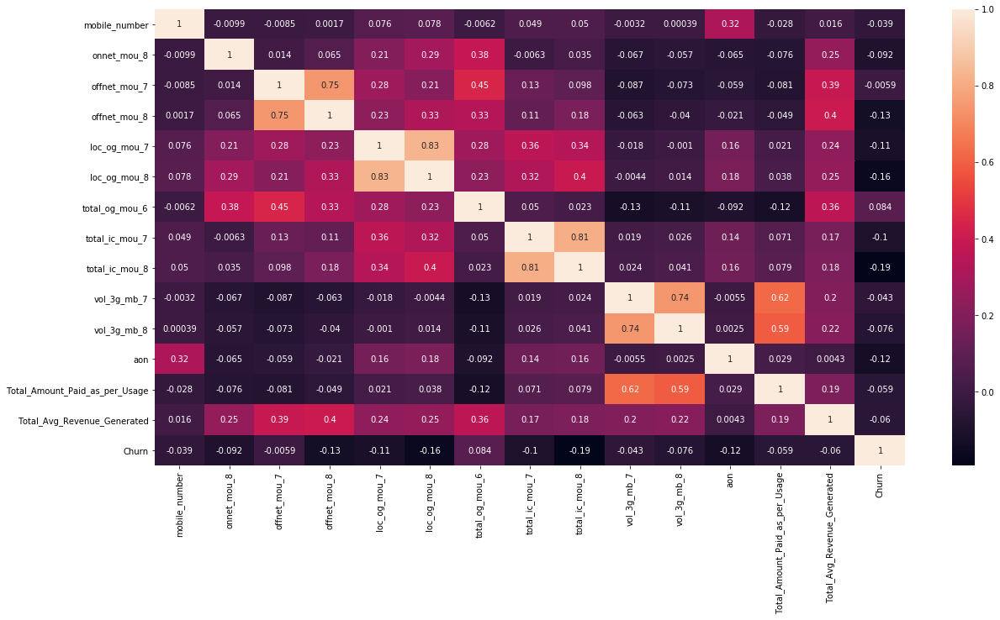

In [126]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [127]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('loc_og_mou_7',1)
X_train_mod2 = X_train_mod2.drop('loc_og_mou_7',1)
telecom_mod2=telecom_mod2.drop('loc_og_mou_7',axis=1)

In [128]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20972
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4403.2
Date:                Sat, 17 Nov 2018   Deviance:                       8806.5
Time:                        11:31:51   Pearson chi2:                 5.31e+07
No. Iterations:                     8   Covariance Type:             nonrobust
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                            -41.2732    283.381     -0.146      0.884    -596.689     514.142
mobile_number                   5.769e-09   4.05e-08      0.143      0.887   -7.36e-08    8.51e-08
onnet_mou_8                       -0.0013      0.000    -11.508      0.000      -0.002      -0.001
offnet_mou_7                       0.0003   8.19e-05      3.339      0.001       0.000       0.000
offnet_mou_8                      -0.0015      0.000    -10.769      0.000      -0.002      -0.001
loc_og_mou_8                      -0.0010      0.000     -3.885      0.000      -0.002      -0.001
total_og_mou_6                     0.0004   4.47e-05      9.210      0.000       0.000       0.000
total_ic_mou_7                     0.0022      0.000     13.055      0.000       0.002       0.002
total_ic_mou_8                    -0.0090      0.000    -21.873      0.000      -0.010      -0.008
vol_3g_mb_7                        0.0002   5.66e-05      3.457      0.001    8.48e-05       0.000
vol_3g_mb_8                       -0.0010      0.000     -8.935      0.000      -0.001      -0.001
aon                               -0.0002    3.9e-05     -6.128      0.000      -0.000      -0.000
Total_Amount_Paid_as_per_Usage -8.579e-05   5.57e-05     -1.540      0.124      -0.000    2.34e-05
Total_Avg_Revenue_Generated     6.736e-05   2.08e-05      3.235      0.001    2.66e-05       0.000
==================================================================================================
"""

In [129]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
7,total_ic_mou_8,3.27
6,total_ic_mou_7,3.08
2,offnet_mou_7,2.73
3,offnet_mou_8,2.57
8,vol_3g_mb_7,2.56
9,vol_3g_mb_8,2.41
11,Total_Amount_Paid_as_per_Usage,1.78
5,total_og_mou_6,1.60
12,Total_Avg_Revenue_Generated,1.54
4,loc_og_mou_8,1.48


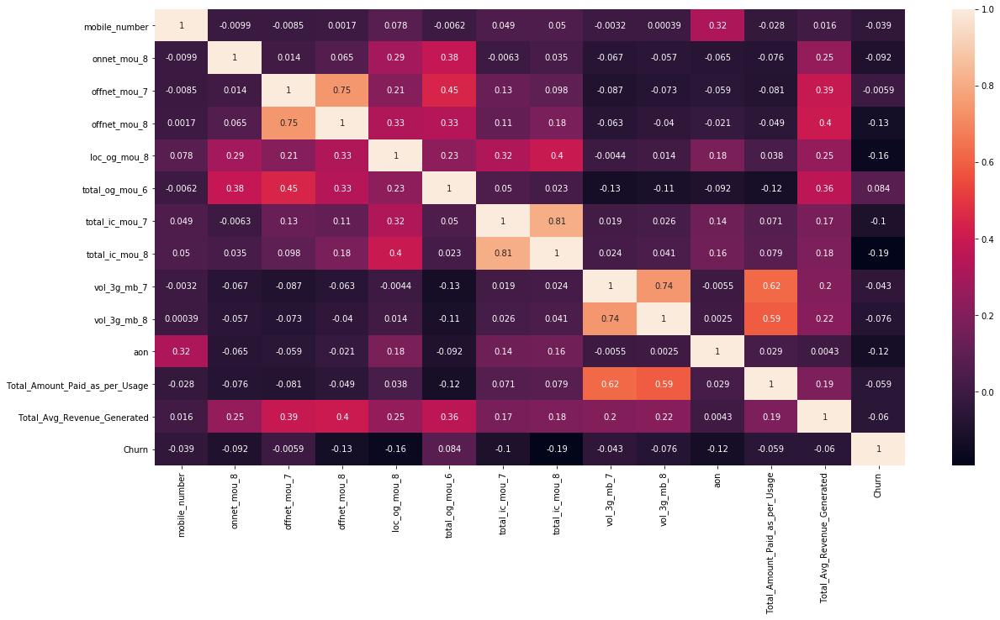

In [130]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [131]:
#Dropping highly correlated variables
X_test_mod2 = X_test_mod2.drop('Total_Amount_Paid_as_per_Usage',1)
X_train_mod2 = X_train_mod2.drop('Total_Amount_Paid_as_per_Usage',1)
telecom_mod2=telecom_mod2.drop('Total_Amount_Paid_as_per_Usage',axis=1)

In [132]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20973
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4404.5
Date:                Sat, 17 Nov 2018   Deviance:                       8808.9
Time:                        11:31:53   Pearson chi2:                 6.75e+07
No. Iterations:                     8   Covariance Type:             nonrobust
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                         -65.6212    282.972     -0.232      0.817    -620.236     488.994
mobile_number                9.245e-09   4.04e-08      0.229      0.819      -7e-08    8.85e-08
onnet_mou_8                    -0.0013      0.000    -11.451      0.000      -0.002      -0.001
offnet_mou_7                    0.0003   8.18e-05      3.396      0.001       0.000       0.000
offnet_mou_8                   -0.0015      0.000    -10.758      0.000      -0.002      -0.001
loc_og_mou_8                   -0.0010      0.000     -3.901      0.000      -0.002      -0.001
total_og_mou_6                  0.0004   4.46e-05      9.293      0.000       0.000       0.001
total_ic_mou_7                  0.0021      0.000     13.019      0.000       0.002       0.002
total_ic_mou_8                 -0.0090      0.000    -21.901      0.000      -0.010      -0.008
vol_3g_mb_7                     0.0002   5.16e-05      3.022      0.003    5.48e-05       0.000
vol_3g_mb_8                    -0.0010      0.000     -9.610      0.000      -0.001      -0.001
aon                            -0.0002    3.9e-05     -6.178      0.000      -0.000      -0.000
Total_Avg_Revenue_Generated  6.589e-05   2.12e-05      3.109      0.002    2.43e-05       0.000
===============================================================================================
"""

In [133]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
7,total_ic_mou_8,3.27
6,total_ic_mou_7,3.08
2,offnet_mou_7,2.72
3,offnet_mou_8,2.57
8,vol_3g_mb_7,2.29
9,vol_3g_mb_8,2.28
5,total_og_mou_6,1.60
11,Total_Avg_Revenue_Generated,1.52
4,loc_og_mou_8,1.48
1,onnet_mou_8,1.37


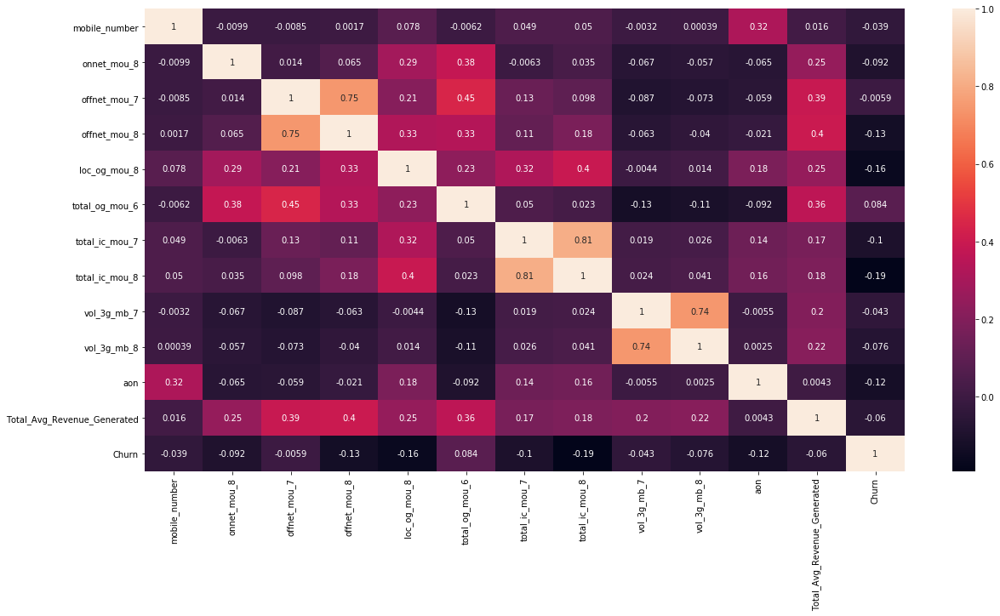

In [134]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

In [135]:
#Dropping Mobile Number column
X_test_mod2 = X_test_mod2.drop('mobile_number',1)
X_train_mod2 = X_train_mod2.drop('mobile_number',1)
telecom_mod2=telecom_mod2.drop('mobile_number',axis=1)

In [136]:
# Building Logistic regression model again
logm2 = sm.GLM(Y_train_mod2,(sm.add_constant(X_train_mod2)), family = sm.families.Binomial())
logm2.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                20985
Model:                            GLM   Df Residuals:                    20973
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4404.5
Date:                Sat, 17 Nov 2018   Deviance:                       8809.0
Time:                        11:31:56   Pearson chi2:                 6.72e+07
No. Iterations:                     8   Covariance Type:             nonrobust
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -0.8958      0.065    -13.860      0.000      -1.022      -0.769
onnet_mou_8                    -0.0013      0.000    -11.449      0.000      -0.002      -0.001
offnet_mou_7                    0.0003   8.18e-05      3.399      0.001       0.000       0.000
offnet_mou_8                   -0.0015      0.000    -10.760      0.000      -0.002      -0.001
loc_og_mou_8                   -0.0010      0.000     -3.899      0.000      -0.002      -0.001
total_og_mou_6                  0.0004   4.46e-05      9.300      0.000       0.000       0.001
total_ic_mou_7                  0.0021      0.000     13.019      0.000       0.002       0.002
total_ic_mou_8                 -0.0090      0.000    -21.901      0.000      -0.010      -0.008
vol_3g_mb_7                     0.0002   5.15e-05      3.024      0.002    5.49e-05       0.000
vol_3g_mb_8                    -0.0010      0.000     -9.612      0.000      -0.001      -0.001
aon                            -0.0002   3.74e-05     -6.373      0.000      -0.000      -0.000
Total_Avg_Revenue_Generated  6.593e-05   2.12e-05      3.112      0.002    2.44e-05       0.000
===============================================================================================
"""

In [137]:
# Calculating Vif value for the mod2 dataframe
vif_cal(input_data=telecom_mod2, dependent_col='Churn')

,Feature,Vif
6,total_ic_mou_8,5.45
5,total_ic_mou_7,5.27
1,offnet_mou_7,4.78
2,offnet_mou_8,4.20
10,Total_Avg_Revenue_Generated,4.11
4,total_og_mou_6,3.16
7,vol_3g_mb_7,2.52
8,vol_3g_mb_8,2.51
3,loc_og_mou_8,2.23
9,aon,1.99


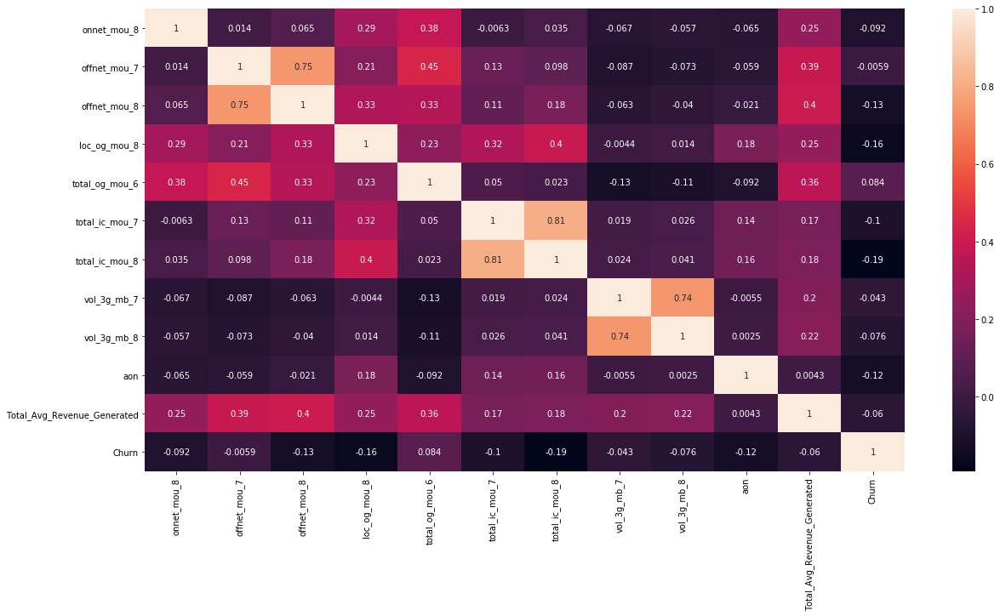

In [138]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telecom_mod2.corr(),annot = True)

Thus, we conclude that the following are important predictors of churn:

1.total_ic_mou_8 : Total minutes of usage for incoming calls for the previous month(August)

2.total_ic_mou_7 : Total minutes of usage for incoming calls for the penultimate month(July)

3.offnet_mou_7 : Minutes of Usage for all kind of calls outside the operator network for the penulimate month(July)

4.offnet_mou_8 : Minutes of Usage for all kind of calls outside the operator network for the previous month(August)

5.vol_3g_mb_7 : Usage volume of 3G mobile interbet for the penultimate month(July)

6.vol_3g_mb_8 : Usage volume of 3G mobile interbet for the previous month(August)

7.total_og_mou_6 : Total minutes of Usage for outgoing voice calls for the penultimate month(June)

8.loc_og_mou_8 : Minutes of usage of outgoing local calls within the same telecom circle for the previous month(August)

9.onnet_mou_8 : Minutes of usage for All kind of calls within the same operator network for the previous month(August)

10.aon : Age on network - number of days the customer is using the operator network

11.Total_Avg_Revenue_Generated : Total Average Revenue Per User generated for all months(provided in the data)